# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip -o processed-celeba-small.zip 

Archive:  processed-celeba-small.zip
  inflating: processed_celeba_small/.DS_Store  
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
  inflating: processed_celeba_small/celeba/.DS_Store  
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeba_small/celeba/161988.jpg  
  inflating: processed_celeba_small/celeba/161989.jpg  
  inflating: processed_celeba_small/celeba/161990.jpg  
  inflating: processed_celeba_small/celeba/161991.jpg  
  infla

  inflating: processed_celeba_small/celeba/162272.jpg  
  inflating: processed_celeba_small/celeba/162273.jpg  
  inflating: processed_celeba_small/celeba/162274.jpg  
  inflating: processed_celeba_small/celeba/162275.jpg  
  inflating: processed_celeba_small/celeba/162276.jpg  
  inflating: processed_celeba_small/celeba/162277.jpg  
  inflating: processed_celeba_small/celeba/162278.jpg  
  inflating: processed_celeba_small/celeba/162279.jpg  
  inflating: processed_celeba_small/celeba/162280.jpg  
  inflating: processed_celeba_small/celeba/162281.jpg  
  inflating: processed_celeba_small/celeba/162282.jpg  
  inflating: processed_celeba_small/celeba/162283.jpg  
  inflating: processed_celeba_small/celeba/162284.jpg  
  inflating: processed_celeba_small/celeba/162285.jpg  
  inflating: processed_celeba_small/celeba/162286.jpg  
  inflating: processed_celeba_small/celeba/162287.jpg  
  inflating: processed_celeba_small/celeba/162288.jpg  
  inflating: processed_celeba_small/celeba/16228

  inflating: processed_celeba_small/celeba/162544.jpg  
  inflating: processed_celeba_small/celeba/162545.jpg  
  inflating: processed_celeba_small/celeba/162546.jpg  
  inflating: processed_celeba_small/celeba/162547.jpg  
  inflating: processed_celeba_small/celeba/162548.jpg  
  inflating: processed_celeba_small/celeba/162549.jpg  
  inflating: processed_celeba_small/celeba/162550.jpg  
  inflating: processed_celeba_small/celeba/162551.jpg  
  inflating: processed_celeba_small/celeba/162552.jpg  
  inflating: processed_celeba_small/celeba/162553.jpg  
  inflating: processed_celeba_small/celeba/162554.jpg  
  inflating: processed_celeba_small/celeba/162555.jpg  
  inflating: processed_celeba_small/celeba/162556.jpg  
  inflating: processed_celeba_small/celeba/162557.jpg  
  inflating: processed_celeba_small/celeba/162558.jpg  
  inflating: processed_celeba_small/celeba/162559.jpg  
  inflating: processed_celeba_small/celeba/162560.jpg  
  inflating: processed_celeba_small/celeba/16256

  inflating: processed_celeba_small/celeba/162953.jpg  
  inflating: processed_celeba_small/celeba/162954.jpg  
  inflating: processed_celeba_small/celeba/162955.jpg  
  inflating: processed_celeba_small/celeba/162956.jpg  
  inflating: processed_celeba_small/celeba/162957.jpg  
  inflating: processed_celeba_small/celeba/162958.jpg  
  inflating: processed_celeba_small/celeba/162959.jpg  
  inflating: processed_celeba_small/celeba/162960.jpg  
  inflating: processed_celeba_small/celeba/162961.jpg  
  inflating: processed_celeba_small/celeba/162962.jpg  
  inflating: processed_celeba_small/celeba/162963.jpg  
  inflating: processed_celeba_small/celeba/162964.jpg  
  inflating: processed_celeba_small/celeba/162965.jpg  
  inflating: processed_celeba_small/celeba/162966.jpg  
  inflating: processed_celeba_small/celeba/162967.jpg  
  inflating: processed_celeba_small/celeba/162968.jpg  
  inflating: processed_celeba_small/celeba/162969.jpg  
  inflating: processed_celeba_small/celeba/16297

  inflating: processed_celeba_small/celeba/163191.jpg  
  inflating: processed_celeba_small/celeba/163192.jpg  
  inflating: processed_celeba_small/celeba/163193.jpg  
  inflating: processed_celeba_small/celeba/163194.jpg  
  inflating: processed_celeba_small/celeba/163195.jpg  
  inflating: processed_celeba_small/celeba/163196.jpg  
  inflating: processed_celeba_small/celeba/163197.jpg  
  inflating: processed_celeba_small/celeba/163198.jpg  
  inflating: processed_celeba_small/celeba/163199.jpg  
  inflating: processed_celeba_small/celeba/163200.jpg  
  inflating: processed_celeba_small/celeba/163201.jpg  
  inflating: processed_celeba_small/celeba/163202.jpg  
  inflating: processed_celeba_small/celeba/163203.jpg  
  inflating: processed_celeba_small/celeba/163204.jpg  
  inflating: processed_celeba_small/celeba/163205.jpg  
  inflating: processed_celeba_small/celeba/163206.jpg  
  inflating: processed_celeba_small/celeba/163207.jpg  
  inflating: processed_celeba_small/celeba/16320

  inflating: processed_celeba_small/celeba/163619.jpg  
  inflating: processed_celeba_small/celeba/163620.jpg  
  inflating: processed_celeba_small/celeba/163621.jpg  
  inflating: processed_celeba_small/celeba/163622.jpg  
  inflating: processed_celeba_small/celeba/163623.jpg  
  inflating: processed_celeba_small/celeba/163624.jpg  
  inflating: processed_celeba_small/celeba/163625.jpg  
  inflating: processed_celeba_small/celeba/163626.jpg  
  inflating: processed_celeba_small/celeba/163627.jpg  
  inflating: processed_celeba_small/celeba/163628.jpg  
  inflating: processed_celeba_small/celeba/163629.jpg  
  inflating: processed_celeba_small/celeba/163630.jpg  
  inflating: processed_celeba_small/celeba/163631.jpg  
  inflating: processed_celeba_small/celeba/163632.jpg  
  inflating: processed_celeba_small/celeba/163633.jpg  
  inflating: processed_celeba_small/celeba/163634.jpg  
  inflating: processed_celeba_small/celeba/163635.jpg  
  inflating: processed_celeba_small/celeba/16363

  inflating: processed_celeba_small/celeba/163868.jpg  
  inflating: processed_celeba_small/celeba/163869.jpg  
  inflating: processed_celeba_small/celeba/163870.jpg  
  inflating: processed_celeba_small/celeba/163871.jpg  
  inflating: processed_celeba_small/celeba/163872.jpg  
  inflating: processed_celeba_small/celeba/163873.jpg  
  inflating: processed_celeba_small/celeba/163874.jpg  
  inflating: processed_celeba_small/celeba/163875.jpg  
  inflating: processed_celeba_small/celeba/163876.jpg  
  inflating: processed_celeba_small/celeba/163877.jpg  
  inflating: processed_celeba_small/celeba/163878.jpg  
  inflating: processed_celeba_small/celeba/163879.jpg  
  inflating: processed_celeba_small/celeba/163880.jpg  
  inflating: processed_celeba_small/celeba/163881.jpg  
  inflating: processed_celeba_small/celeba/163882.jpg  
  inflating: processed_celeba_small/celeba/163883.jpg  
  inflating: processed_celeba_small/celeba/163884.jpg  
  inflating: processed_celeba_small/celeba/16388

  inflating: processed_celeba_small/celeba/164310.jpg  
  inflating: processed_celeba_small/celeba/164311.jpg  
  inflating: processed_celeba_small/celeba/164312.jpg  
  inflating: processed_celeba_small/celeba/164313.jpg  
  inflating: processed_celeba_small/celeba/164314.jpg  
  inflating: processed_celeba_small/celeba/164315.jpg  
  inflating: processed_celeba_small/celeba/164316.jpg  
  inflating: processed_celeba_small/celeba/164317.jpg  
  inflating: processed_celeba_small/celeba/164318.jpg  
  inflating: processed_celeba_small/celeba/164319.jpg  
  inflating: processed_celeba_small/celeba/164320.jpg  
  inflating: processed_celeba_small/celeba/164321.jpg  
  inflating: processed_celeba_small/celeba/164322.jpg  
  inflating: processed_celeba_small/celeba/164323.jpg  
  inflating: processed_celeba_small/celeba/164324.jpg  
  inflating: processed_celeba_small/celeba/164325.jpg  
  inflating: processed_celeba_small/celeba/164326.jpg  
  inflating: processed_celeba_small/celeba/16432

  inflating: processed_celeba_small/celeba/164566.jpg  
  inflating: processed_celeba_small/celeba/164567.jpg  
  inflating: processed_celeba_small/celeba/164568.jpg  
  inflating: processed_celeba_small/celeba/164569.jpg  
  inflating: processed_celeba_small/celeba/164570.jpg  
  inflating: processed_celeba_small/celeba/164571.jpg  
  inflating: processed_celeba_small/celeba/164572.jpg  
  inflating: processed_celeba_small/celeba/164573.jpg  
  inflating: processed_celeba_small/celeba/164574.jpg  
  inflating: processed_celeba_small/celeba/164575.jpg  
  inflating: processed_celeba_small/celeba/164576.jpg  
  inflating: processed_celeba_small/celeba/164577.jpg  
  inflating: processed_celeba_small/celeba/164578.jpg  
  inflating: processed_celeba_small/celeba/164579.jpg  
  inflating: processed_celeba_small/celeba/164580.jpg  
  inflating: processed_celeba_small/celeba/164581.jpg  
  inflating: processed_celeba_small/celeba/164582.jpg  
  inflating: processed_celeba_small/celeba/16458

  inflating: processed_celeba_small/celeba/165006.jpg  
  inflating: processed_celeba_small/celeba/165007.jpg  
  inflating: processed_celeba_small/celeba/165008.jpg  
  inflating: processed_celeba_small/celeba/165009.jpg  
  inflating: processed_celeba_small/celeba/165010.jpg  
  inflating: processed_celeba_small/celeba/165011.jpg  
  inflating: processed_celeba_small/celeba/165012.jpg  
  inflating: processed_celeba_small/celeba/165013.jpg  
  inflating: processed_celeba_small/celeba/165014.jpg  
  inflating: processed_celeba_small/celeba/165015.jpg  
  inflating: processed_celeba_small/celeba/165016.jpg  
  inflating: processed_celeba_small/celeba/165017.jpg  
  inflating: processed_celeba_small/celeba/165018.jpg  
  inflating: processed_celeba_small/celeba/165019.jpg  
  inflating: processed_celeba_small/celeba/165020.jpg  
  inflating: processed_celeba_small/celeba/165021.jpg  
  inflating: processed_celeba_small/celeba/165022.jpg  
  inflating: processed_celeba_small/celeba/16502

  inflating: processed_celeba_small/celeba/165272.jpg  
  inflating: processed_celeba_small/celeba/165273.jpg  
  inflating: processed_celeba_small/celeba/165274.jpg  
  inflating: processed_celeba_small/celeba/165275.jpg  
  inflating: processed_celeba_small/celeba/165276.jpg  
  inflating: processed_celeba_small/celeba/165277.jpg  
  inflating: processed_celeba_small/celeba/165278.jpg  
  inflating: processed_celeba_small/celeba/165279.jpg  
  inflating: processed_celeba_small/celeba/165280.jpg  
  inflating: processed_celeba_small/celeba/165281.jpg  
  inflating: processed_celeba_small/celeba/165282.jpg  
  inflating: processed_celeba_small/celeba/165283.jpg  
  inflating: processed_celeba_small/celeba/165284.jpg  
  inflating: processed_celeba_small/celeba/165285.jpg  
  inflating: processed_celeba_small/celeba/165286.jpg  
  inflating: processed_celeba_small/celeba/165287.jpg  
  inflating: processed_celeba_small/celeba/165288.jpg  
  inflating: processed_celeba_small/celeba/16528

  inflating: processed_celeba_small/celeba/165707.jpg  
  inflating: processed_celeba_small/celeba/165708.jpg  
  inflating: processed_celeba_small/celeba/165709.jpg  
  inflating: processed_celeba_small/celeba/165710.jpg  
  inflating: processed_celeba_small/celeba/165711.jpg  
  inflating: processed_celeba_small/celeba/165712.jpg  
  inflating: processed_celeba_small/celeba/165713.jpg  
  inflating: processed_celeba_small/celeba/165714.jpg  
  inflating: processed_celeba_small/celeba/165715.jpg  
  inflating: processed_celeba_small/celeba/165716.jpg  
  inflating: processed_celeba_small/celeba/165717.jpg  
  inflating: processed_celeba_small/celeba/165718.jpg  
  inflating: processed_celeba_small/celeba/165719.jpg  
  inflating: processed_celeba_small/celeba/165720.jpg  
  inflating: processed_celeba_small/celeba/165721.jpg  
  inflating: processed_celeba_small/celeba/165722.jpg  
  inflating: processed_celeba_small/celeba/165723.jpg  
  inflating: processed_celeba_small/celeba/16572

  inflating: processed_celeba_small/celeba/165946.jpg  
  inflating: processed_celeba_small/celeba/165947.jpg  
  inflating: processed_celeba_small/celeba/165948.jpg  
  inflating: processed_celeba_small/celeba/165949.jpg  
  inflating: processed_celeba_small/celeba/165950.jpg  
  inflating: processed_celeba_small/celeba/165951.jpg  
  inflating: processed_celeba_small/celeba/165952.jpg  
  inflating: processed_celeba_small/celeba/165953.jpg  
  inflating: processed_celeba_small/celeba/165954.jpg  
  inflating: processed_celeba_small/celeba/165955.jpg  
  inflating: processed_celeba_small/celeba/165956.jpg  
  inflating: processed_celeba_small/celeba/165957.jpg  
  inflating: processed_celeba_small/celeba/165958.jpg  
  inflating: processed_celeba_small/celeba/165959.jpg  
  inflating: processed_celeba_small/celeba/165960.jpg  
  inflating: processed_celeba_small/celeba/165961.jpg  
  inflating: processed_celeba_small/celeba/165962.jpg  
  inflating: processed_celeba_small/celeba/16596

  inflating: processed_celeba_small/celeba/166398.jpg  
  inflating: processed_celeba_small/celeba/166399.jpg  
  inflating: processed_celeba_small/celeba/166400.jpg  
  inflating: processed_celeba_small/celeba/166401.jpg  
  inflating: processed_celeba_small/celeba/166402.jpg  
  inflating: processed_celeba_small/celeba/166403.jpg  
  inflating: processed_celeba_small/celeba/166404.jpg  
  inflating: processed_celeba_small/celeba/166405.jpg  
  inflating: processed_celeba_small/celeba/166406.jpg  
  inflating: processed_celeba_small/celeba/166407.jpg  
  inflating: processed_celeba_small/celeba/166408.jpg  
  inflating: processed_celeba_small/celeba/166409.jpg  
  inflating: processed_celeba_small/celeba/166410.jpg  
  inflating: processed_celeba_small/celeba/166411.jpg  
  inflating: processed_celeba_small/celeba/166412.jpg  
  inflating: processed_celeba_small/celeba/166413.jpg  
  inflating: processed_celeba_small/celeba/166414.jpg  
  inflating: processed_celeba_small/celeba/16641

  inflating: processed_celeba_small/celeba/166682.jpg  
  inflating: processed_celeba_small/celeba/166683.jpg  
  inflating: processed_celeba_small/celeba/166684.jpg  
  inflating: processed_celeba_small/celeba/166685.jpg  
  inflating: processed_celeba_small/celeba/166686.jpg  
  inflating: processed_celeba_small/celeba/166687.jpg  
  inflating: processed_celeba_small/celeba/166688.jpg  
  inflating: processed_celeba_small/celeba/166689.jpg  
  inflating: processed_celeba_small/celeba/166690.jpg  
  inflating: processed_celeba_small/celeba/166691.jpg  
  inflating: processed_celeba_small/celeba/166692.jpg  
  inflating: processed_celeba_small/celeba/166693.jpg  
  inflating: processed_celeba_small/celeba/166694.jpg  
  inflating: processed_celeba_small/celeba/166695.jpg  
  inflating: processed_celeba_small/celeba/166696.jpg  
  inflating: processed_celeba_small/celeba/166697.jpg  
  inflating: processed_celeba_small/celeba/166698.jpg  
  inflating: processed_celeba_small/celeba/16669

  inflating: processed_celeba_small/celeba/167140.jpg  
  inflating: processed_celeba_small/celeba/167141.jpg  
  inflating: processed_celeba_small/celeba/167142.jpg  
  inflating: processed_celeba_small/celeba/167143.jpg  
  inflating: processed_celeba_small/celeba/167144.jpg  
  inflating: processed_celeba_small/celeba/167145.jpg  
  inflating: processed_celeba_small/celeba/167146.jpg  
  inflating: processed_celeba_small/celeba/167147.jpg  
  inflating: processed_celeba_small/celeba/167148.jpg  
  inflating: processed_celeba_small/celeba/167149.jpg  
  inflating: processed_celeba_small/celeba/167150.jpg  
  inflating: processed_celeba_small/celeba/167151.jpg  
  inflating: processed_celeba_small/celeba/167152.jpg  
  inflating: processed_celeba_small/celeba/167153.jpg  
  inflating: processed_celeba_small/celeba/167154.jpg  
  inflating: processed_celeba_small/celeba/167155.jpg  
  inflating: processed_celeba_small/celeba/167156.jpg  
  inflating: processed_celeba_small/celeba/16715

  inflating: processed_celeba_small/celeba/167443.jpg  
  inflating: processed_celeba_small/celeba/167444.jpg  
  inflating: processed_celeba_small/celeba/167445.jpg  
  inflating: processed_celeba_small/celeba/167446.jpg  
  inflating: processed_celeba_small/celeba/167447.jpg  
  inflating: processed_celeba_small/celeba/167448.jpg  
  inflating: processed_celeba_small/celeba/167449.jpg  
  inflating: processed_celeba_small/celeba/167450.jpg  
  inflating: processed_celeba_small/celeba/167451.jpg  
  inflating: processed_celeba_small/celeba/167452.jpg  
  inflating: processed_celeba_small/celeba/167453.jpg  
  inflating: processed_celeba_small/celeba/167454.jpg  
  inflating: processed_celeba_small/celeba/167455.jpg  
  inflating: processed_celeba_small/celeba/167456.jpg  
  inflating: processed_celeba_small/celeba/167457.jpg  
  inflating: processed_celeba_small/celeba/167458.jpg  
  inflating: processed_celeba_small/celeba/167459.jpg  
  inflating: processed_celeba_small/celeba/16746

  inflating: processed_celeba_small/celeba/167780.jpg  
  inflating: processed_celeba_small/celeba/167781.jpg  
  inflating: processed_celeba_small/celeba/167782.jpg  
  inflating: processed_celeba_small/celeba/167783.jpg  
  inflating: processed_celeba_small/celeba/167784.jpg  
  inflating: processed_celeba_small/celeba/167785.jpg  
  inflating: processed_celeba_small/celeba/167786.jpg  
  inflating: processed_celeba_small/celeba/167787.jpg  
  inflating: processed_celeba_small/celeba/167788.jpg  
  inflating: processed_celeba_small/celeba/167789.jpg  
  inflating: processed_celeba_small/celeba/167790.jpg  
  inflating: processed_celeba_small/celeba/167791.jpg  
  inflating: processed_celeba_small/celeba/167792.jpg  
  inflating: processed_celeba_small/celeba/167793.jpg  
  inflating: processed_celeba_small/celeba/167794.jpg  
  inflating: processed_celeba_small/celeba/167795.jpg  
  inflating: processed_celeba_small/celeba/167796.jpg  
  inflating: processed_celeba_small/celeba/16779

  inflating: processed_celeba_small/celeba/168220.jpg  
  inflating: processed_celeba_small/celeba/168221.jpg  
  inflating: processed_celeba_small/celeba/168222.jpg  
  inflating: processed_celeba_small/celeba/168223.jpg  
  inflating: processed_celeba_small/celeba/168224.jpg  
  inflating: processed_celeba_small/celeba/168225.jpg  
  inflating: processed_celeba_small/celeba/168226.jpg  
  inflating: processed_celeba_small/celeba/168227.jpg  
  inflating: processed_celeba_small/celeba/168228.jpg  
  inflating: processed_celeba_small/celeba/168229.jpg  
  inflating: processed_celeba_small/celeba/168230.jpg  
  inflating: processed_celeba_small/celeba/168231.jpg  
  inflating: processed_celeba_small/celeba/168232.jpg  
  inflating: processed_celeba_small/celeba/168233.jpg  
  inflating: processed_celeba_small/celeba/168234.jpg  
  inflating: processed_celeba_small/celeba/168235.jpg  
  inflating: processed_celeba_small/celeba/168236.jpg  
  inflating: processed_celeba_small/celeba/16823

  inflating: processed_celeba_small/celeba/168517.jpg  
  inflating: processed_celeba_small/celeba/168518.jpg  
  inflating: processed_celeba_small/celeba/168519.jpg  
  inflating: processed_celeba_small/celeba/168520.jpg  
  inflating: processed_celeba_small/celeba/168521.jpg  
  inflating: processed_celeba_small/celeba/168522.jpg  
  inflating: processed_celeba_small/celeba/168523.jpg  
  inflating: processed_celeba_small/celeba/168524.jpg  
  inflating: processed_celeba_small/celeba/168525.jpg  
  inflating: processed_celeba_small/celeba/168526.jpg  
  inflating: processed_celeba_small/celeba/168527.jpg  
  inflating: processed_celeba_small/celeba/168528.jpg  
  inflating: processed_celeba_small/celeba/168529.jpg  
  inflating: processed_celeba_small/celeba/168530.jpg  
  inflating: processed_celeba_small/celeba/168531.jpg  
  inflating: processed_celeba_small/celeba/168532.jpg  
  inflating: processed_celeba_small/celeba/168533.jpg  
  inflating: processed_celeba_small/celeba/16853

  inflating: processed_celeba_small/celeba/168974.jpg  
  inflating: processed_celeba_small/celeba/168975.jpg  
  inflating: processed_celeba_small/celeba/168976.jpg  
  inflating: processed_celeba_small/celeba/168977.jpg  
  inflating: processed_celeba_small/celeba/168978.jpg  
  inflating: processed_celeba_small/celeba/168979.jpg  
  inflating: processed_celeba_small/celeba/168980.jpg  
  inflating: processed_celeba_small/celeba/168981.jpg  
  inflating: processed_celeba_small/celeba/168982.jpg  
  inflating: processed_celeba_small/celeba/168983.jpg  
  inflating: processed_celeba_small/celeba/168984.jpg  
  inflating: processed_celeba_small/celeba/168985.jpg  
  inflating: processed_celeba_small/celeba/168986.jpg  
  inflating: processed_celeba_small/celeba/168987.jpg  
  inflating: processed_celeba_small/celeba/168988.jpg  
  inflating: processed_celeba_small/celeba/168989.jpg  
  inflating: processed_celeba_small/celeba/168990.jpg  
  inflating: processed_celeba_small/celeba/16899

  inflating: processed_celeba_small/celeba/169263.jpg  
  inflating: processed_celeba_small/celeba/169264.jpg  
  inflating: processed_celeba_small/celeba/169265.jpg  
  inflating: processed_celeba_small/celeba/169266.jpg  
  inflating: processed_celeba_small/celeba/169267.jpg  
  inflating: processed_celeba_small/celeba/169268.jpg  
  inflating: processed_celeba_small/celeba/169269.jpg  
  inflating: processed_celeba_small/celeba/169270.jpg  
  inflating: processed_celeba_small/celeba/169271.jpg  
  inflating: processed_celeba_small/celeba/169272.jpg  
  inflating: processed_celeba_small/celeba/169273.jpg  
  inflating: processed_celeba_small/celeba/169274.jpg  
  inflating: processed_celeba_small/celeba/169275.jpg  
  inflating: processed_celeba_small/celeba/169276.jpg  
  inflating: processed_celeba_small/celeba/169277.jpg  
  inflating: processed_celeba_small/celeba/169278.jpg  
  inflating: processed_celeba_small/celeba/169279.jpg  
  inflating: processed_celeba_small/celeba/16928

  inflating: processed_celeba_small/celeba/169688.jpg  
  inflating: processed_celeba_small/celeba/169689.jpg  
  inflating: processed_celeba_small/celeba/169690.jpg  
  inflating: processed_celeba_small/celeba/169691.jpg  
  inflating: processed_celeba_small/celeba/169692.jpg  
  inflating: processed_celeba_small/celeba/169693.jpg  
  inflating: processed_celeba_small/celeba/169694.jpg  
  inflating: processed_celeba_small/celeba/169695.jpg  
  inflating: processed_celeba_small/celeba/169696.jpg  
  inflating: processed_celeba_small/celeba/169697.jpg  
  inflating: processed_celeba_small/celeba/169698.jpg  
  inflating: processed_celeba_small/celeba/169699.jpg  
  inflating: processed_celeba_small/celeba/169700.jpg  
  inflating: processed_celeba_small/celeba/169701.jpg  
  inflating: processed_celeba_small/celeba/169702.jpg  
  inflating: processed_celeba_small/celeba/169703.jpg  
  inflating: processed_celeba_small/celeba/169704.jpg  
  inflating: processed_celeba_small/celeba/16970

  inflating: processed_celeba_small/celeba/170149.jpg  
  inflating: processed_celeba_small/celeba/170150.jpg  
  inflating: processed_celeba_small/celeba/170151.jpg  
  inflating: processed_celeba_small/celeba/170152.jpg  
  inflating: processed_celeba_small/celeba/170153.jpg  
  inflating: processed_celeba_small/celeba/170154.jpg  
  inflating: processed_celeba_small/celeba/170155.jpg  
  inflating: processed_celeba_small/celeba/170156.jpg  
  inflating: processed_celeba_small/celeba/170157.jpg  
  inflating: processed_celeba_small/celeba/170158.jpg  
  inflating: processed_celeba_small/celeba/170159.jpg  
  inflating: processed_celeba_small/celeba/170160.jpg  
  inflating: processed_celeba_small/celeba/170161.jpg  
  inflating: processed_celeba_small/celeba/170162.jpg  
  inflating: processed_celeba_small/celeba/170163.jpg  
  inflating: processed_celeba_small/celeba/170164.jpg  
  inflating: processed_celeba_small/celeba/170165.jpg  
  inflating: processed_celeba_small/celeba/17016

  inflating: processed_celeba_small/celeba/170397.jpg  
  inflating: processed_celeba_small/celeba/170398.jpg  
  inflating: processed_celeba_small/celeba/170399.jpg  
  inflating: processed_celeba_small/celeba/170400.jpg  
  inflating: processed_celeba_small/celeba/170401.jpg  
  inflating: processed_celeba_small/celeba/170402.jpg  
  inflating: processed_celeba_small/celeba/170403.jpg  
  inflating: processed_celeba_small/celeba/170404.jpg  
  inflating: processed_celeba_small/celeba/170405.jpg  
  inflating: processed_celeba_small/celeba/170406.jpg  
  inflating: processed_celeba_small/celeba/170407.jpg  
  inflating: processed_celeba_small/celeba/170408.jpg  
  inflating: processed_celeba_small/celeba/170409.jpg  
  inflating: processed_celeba_small/celeba/170410.jpg  
  inflating: processed_celeba_small/celeba/170411.jpg  
  inflating: processed_celeba_small/celeba/170412.jpg  
  inflating: processed_celeba_small/celeba/170413.jpg  
  inflating: processed_celeba_small/celeba/17041

  inflating: processed_celeba_small/celeba/170856.jpg  
  inflating: processed_celeba_small/celeba/170857.jpg  
  inflating: processed_celeba_small/celeba/170858.jpg  
  inflating: processed_celeba_small/celeba/170859.jpg  
  inflating: processed_celeba_small/celeba/170860.jpg  
  inflating: processed_celeba_small/celeba/170861.jpg  
  inflating: processed_celeba_small/celeba/170862.jpg  
  inflating: processed_celeba_small/celeba/170863.jpg  
  inflating: processed_celeba_small/celeba/170864.jpg  
  inflating: processed_celeba_small/celeba/170865.jpg  
  inflating: processed_celeba_small/celeba/170866.jpg  
  inflating: processed_celeba_small/celeba/170867.jpg  
  inflating: processed_celeba_small/celeba/170868.jpg  
  inflating: processed_celeba_small/celeba/170869.jpg  
  inflating: processed_celeba_small/celeba/170870.jpg  
  inflating: processed_celeba_small/celeba/170871.jpg  
  inflating: processed_celeba_small/celeba/170872.jpg  
  inflating: processed_celeba_small/celeba/17087

  inflating: processed_celeba_small/celeba/171130.jpg  
  inflating: processed_celeba_small/celeba/171131.jpg  
  inflating: processed_celeba_small/celeba/171132.jpg  
  inflating: processed_celeba_small/celeba/171133.jpg  
  inflating: processed_celeba_small/celeba/171134.jpg  
  inflating: processed_celeba_small/celeba/171135.jpg  
  inflating: processed_celeba_small/celeba/171136.jpg  
  inflating: processed_celeba_small/celeba/171137.jpg  
  inflating: processed_celeba_small/celeba/171138.jpg  
  inflating: processed_celeba_small/celeba/171139.jpg  
  inflating: processed_celeba_small/celeba/171140.jpg  
  inflating: processed_celeba_small/celeba/171141.jpg  
  inflating: processed_celeba_small/celeba/171142.jpg  
  inflating: processed_celeba_small/celeba/171143.jpg  
  inflating: processed_celeba_small/celeba/171144.jpg  
  inflating: processed_celeba_small/celeba/171145.jpg  
  inflating: processed_celeba_small/celeba/171146.jpg  
  inflating: processed_celeba_small/celeba/17114

  inflating: processed_celeba_small/celeba/171585.jpg  
  inflating: processed_celeba_small/celeba/171586.jpg  
  inflating: processed_celeba_small/celeba/171587.jpg  
  inflating: processed_celeba_small/celeba/171588.jpg  
  inflating: processed_celeba_small/celeba/171589.jpg  
  inflating: processed_celeba_small/celeba/171590.jpg  
  inflating: processed_celeba_small/celeba/171591.jpg  
  inflating: processed_celeba_small/celeba/171592.jpg  
  inflating: processed_celeba_small/celeba/171593.jpg  
  inflating: processed_celeba_small/celeba/171594.jpg  
  inflating: processed_celeba_small/celeba/171595.jpg  
  inflating: processed_celeba_small/celeba/171596.jpg  
  inflating: processed_celeba_small/celeba/171597.jpg  
  inflating: processed_celeba_small/celeba/171598.jpg  
  inflating: processed_celeba_small/celeba/171599.jpg  
  inflating: processed_celeba_small/celeba/171600.jpg  
  inflating: processed_celeba_small/celeba/171601.jpg  
  inflating: processed_celeba_small/celeba/17160

  inflating: processed_celeba_small/celeba/171852.jpg  
  inflating: processed_celeba_small/celeba/171853.jpg  
  inflating: processed_celeba_small/celeba/171854.jpg  
  inflating: processed_celeba_small/celeba/171855.jpg  
  inflating: processed_celeba_small/celeba/171856.jpg  
  inflating: processed_celeba_small/celeba/171857.jpg  
  inflating: processed_celeba_small/celeba/171858.jpg  
  inflating: processed_celeba_small/celeba/171859.jpg  
  inflating: processed_celeba_small/celeba/171860.jpg  
  inflating: processed_celeba_small/celeba/171861.jpg  
  inflating: processed_celeba_small/celeba/171862.jpg  
  inflating: processed_celeba_small/celeba/171863.jpg  
  inflating: processed_celeba_small/celeba/171864.jpg  
  inflating: processed_celeba_small/celeba/171865.jpg  
  inflating: processed_celeba_small/celeba/171866.jpg  
  inflating: processed_celeba_small/celeba/171867.jpg  
  inflating: processed_celeba_small/celeba/171868.jpg  
  inflating: processed_celeba_small/celeba/17186

  inflating: processed_celeba_small/celeba/172309.jpg  
  inflating: processed_celeba_small/celeba/172310.jpg  
  inflating: processed_celeba_small/celeba/172311.jpg  
  inflating: processed_celeba_small/celeba/172312.jpg  
  inflating: processed_celeba_small/celeba/172313.jpg  
  inflating: processed_celeba_small/celeba/172314.jpg  
  inflating: processed_celeba_small/celeba/172315.jpg  
  inflating: processed_celeba_small/celeba/172316.jpg  
  inflating: processed_celeba_small/celeba/172317.jpg  
  inflating: processed_celeba_small/celeba/172318.jpg  
  inflating: processed_celeba_small/celeba/172319.jpg  
  inflating: processed_celeba_small/celeba/172320.jpg  
  inflating: processed_celeba_small/celeba/172321.jpg  
  inflating: processed_celeba_small/celeba/172322.jpg  
  inflating: processed_celeba_small/celeba/172323.jpg  
  inflating: processed_celeba_small/celeba/172324.jpg  
  inflating: processed_celeba_small/celeba/172325.jpg  
  inflating: processed_celeba_small/celeba/17232

  inflating: processed_celeba_small/celeba/172585.jpg  
  inflating: processed_celeba_small/celeba/172586.jpg  
  inflating: processed_celeba_small/celeba/172587.jpg  
  inflating: processed_celeba_small/celeba/172588.jpg  
  inflating: processed_celeba_small/celeba/172589.jpg  
  inflating: processed_celeba_small/celeba/172590.jpg  
  inflating: processed_celeba_small/celeba/172591.jpg  
  inflating: processed_celeba_small/celeba/172592.jpg  
  inflating: processed_celeba_small/celeba/172593.jpg  
  inflating: processed_celeba_small/celeba/172594.jpg  
  inflating: processed_celeba_small/celeba/172595.jpg  
  inflating: processed_celeba_small/celeba/172596.jpg  
  inflating: processed_celeba_small/celeba/172597.jpg  
  inflating: processed_celeba_small/celeba/172598.jpg  
  inflating: processed_celeba_small/celeba/172599.jpg  
  inflating: processed_celeba_small/celeba/172600.jpg  
  inflating: processed_celeba_small/celeba/172601.jpg  
  inflating: processed_celeba_small/celeba/17260

  inflating: processed_celeba_small/celeba/173036.jpg  
  inflating: processed_celeba_small/celeba/173037.jpg  
  inflating: processed_celeba_small/celeba/173038.jpg  
  inflating: processed_celeba_small/celeba/173039.jpg  
  inflating: processed_celeba_small/celeba/173040.jpg  
  inflating: processed_celeba_small/celeba/173041.jpg  
  inflating: processed_celeba_small/celeba/173042.jpg  
  inflating: processed_celeba_small/celeba/173043.jpg  
  inflating: processed_celeba_small/celeba/173044.jpg  
  inflating: processed_celeba_small/celeba/173045.jpg  
  inflating: processed_celeba_small/celeba/173046.jpg  
  inflating: processed_celeba_small/celeba/173047.jpg  
  inflating: processed_celeba_small/celeba/173048.jpg  
  inflating: processed_celeba_small/celeba/173049.jpg  
  inflating: processed_celeba_small/celeba/173050.jpg  
  inflating: processed_celeba_small/celeba/173051.jpg  
  inflating: processed_celeba_small/celeba/173052.jpg  
  inflating: processed_celeba_small/celeba/17305

  inflating: processed_celeba_small/celeba/173303.jpg  
  inflating: processed_celeba_small/celeba/173304.jpg  
  inflating: processed_celeba_small/celeba/173305.jpg  
  inflating: processed_celeba_small/celeba/173306.jpg  
  inflating: processed_celeba_small/celeba/173307.jpg  
  inflating: processed_celeba_small/celeba/173308.jpg  
  inflating: processed_celeba_small/celeba/173309.jpg  
  inflating: processed_celeba_small/celeba/173310.jpg  
  inflating: processed_celeba_small/celeba/173311.jpg  
  inflating: processed_celeba_small/celeba/173312.jpg  
  inflating: processed_celeba_small/celeba/173313.jpg  
  inflating: processed_celeba_small/celeba/173314.jpg  
  inflating: processed_celeba_small/celeba/173315.jpg  
  inflating: processed_celeba_small/celeba/173316.jpg  
  inflating: processed_celeba_small/celeba/173317.jpg  
  inflating: processed_celeba_small/celeba/173318.jpg  
  inflating: processed_celeba_small/celeba/173319.jpg  
  inflating: processed_celeba_small/celeba/17332

  inflating: processed_celeba_small/celeba/173759.jpg  
  inflating: processed_celeba_small/celeba/173760.jpg  
  inflating: processed_celeba_small/celeba/173761.jpg  
  inflating: processed_celeba_small/celeba/173762.jpg  
  inflating: processed_celeba_small/celeba/173763.jpg  
  inflating: processed_celeba_small/celeba/173764.jpg  
  inflating: processed_celeba_small/celeba/173765.jpg  
  inflating: processed_celeba_small/celeba/173766.jpg  
  inflating: processed_celeba_small/celeba/173767.jpg  
  inflating: processed_celeba_small/celeba/173768.jpg  
  inflating: processed_celeba_small/celeba/173769.jpg  
  inflating: processed_celeba_small/celeba/173770.jpg  
  inflating: processed_celeba_small/celeba/173771.jpg  
  inflating: processed_celeba_small/celeba/173772.jpg  
  inflating: processed_celeba_small/celeba/173773.jpg  
  inflating: processed_celeba_small/celeba/173774.jpg  
  inflating: processed_celeba_small/celeba/173775.jpg  
  inflating: processed_celeba_small/celeba/17377

  inflating: processed_celeba_small/celeba/173957.jpg  
  inflating: processed_celeba_small/celeba/173958.jpg  
  inflating: processed_celeba_small/celeba/173959.jpg  
  inflating: processed_celeba_small/celeba/173960.jpg  
  inflating: processed_celeba_small/celeba/173961.jpg  
  inflating: processed_celeba_small/celeba/173962.jpg  
  inflating: processed_celeba_small/celeba/173963.jpg  
  inflating: processed_celeba_small/celeba/173964.jpg  
  inflating: processed_celeba_small/celeba/173965.jpg  
  inflating: processed_celeba_small/celeba/173966.jpg  
  inflating: processed_celeba_small/celeba/173967.jpg  
  inflating: processed_celeba_small/celeba/173968.jpg  
  inflating: processed_celeba_small/celeba/173969.jpg  
  inflating: processed_celeba_small/celeba/173970.jpg  
  inflating: processed_celeba_small/celeba/173971.jpg  
  inflating: processed_celeba_small/celeba/173972.jpg  
  inflating: processed_celeba_small/celeba/173973.jpg  
  inflating: processed_celeba_small/celeba/17397

  inflating: processed_celeba_small/celeba/174140.jpg  
  inflating: processed_celeba_small/celeba/174141.jpg  
  inflating: processed_celeba_small/celeba/174142.jpg  
  inflating: processed_celeba_small/celeba/174143.jpg  
  inflating: processed_celeba_small/celeba/174144.jpg  
  inflating: processed_celeba_small/celeba/174145.jpg  
  inflating: processed_celeba_small/celeba/174146.jpg  
  inflating: processed_celeba_small/celeba/174147.jpg  
  inflating: processed_celeba_small/celeba/174148.jpg  
  inflating: processed_celeba_small/celeba/174149.jpg  
  inflating: processed_celeba_small/celeba/174150.jpg  
  inflating: processed_celeba_small/celeba/174151.jpg  
  inflating: processed_celeba_small/celeba/174152.jpg  
  inflating: processed_celeba_small/celeba/174153.jpg  
  inflating: processed_celeba_small/celeba/174154.jpg  
  inflating: processed_celeba_small/celeba/174155.jpg  
  inflating: processed_celeba_small/celeba/174156.jpg  
  inflating: processed_celeba_small/celeba/17415

  inflating: processed_celeba_small/celeba/174484.jpg  
  inflating: processed_celeba_small/celeba/174485.jpg  
  inflating: processed_celeba_small/celeba/174486.jpg  
  inflating: processed_celeba_small/celeba/174487.jpg  
  inflating: processed_celeba_small/celeba/174488.jpg  
  inflating: processed_celeba_small/celeba/174489.jpg  
  inflating: processed_celeba_small/celeba/174490.jpg  
  inflating: processed_celeba_small/celeba/174491.jpg  
  inflating: processed_celeba_small/celeba/174492.jpg  
  inflating: processed_celeba_small/celeba/174493.jpg  
  inflating: processed_celeba_small/celeba/174494.jpg  
  inflating: processed_celeba_small/celeba/174495.jpg  
  inflating: processed_celeba_small/celeba/174496.jpg  
  inflating: processed_celeba_small/celeba/174497.jpg  
  inflating: processed_celeba_small/celeba/174498.jpg  
  inflating: processed_celeba_small/celeba/174499.jpg  
  inflating: processed_celeba_small/celeba/174500.jpg  
  inflating: processed_celeba_small/celeba/17450

  inflating: processed_celeba_small/celeba/174936.jpg  
  inflating: processed_celeba_small/celeba/174937.jpg  
  inflating: processed_celeba_small/celeba/174938.jpg  
  inflating: processed_celeba_small/celeba/174939.jpg  
  inflating: processed_celeba_small/celeba/174940.jpg  
  inflating: processed_celeba_small/celeba/174941.jpg  
  inflating: processed_celeba_small/celeba/174942.jpg  
  inflating: processed_celeba_small/celeba/174943.jpg  
  inflating: processed_celeba_small/celeba/174944.jpg  
  inflating: processed_celeba_small/celeba/174945.jpg  
  inflating: processed_celeba_small/celeba/174946.jpg  
  inflating: processed_celeba_small/celeba/174947.jpg  
  inflating: processed_celeba_small/celeba/174948.jpg  
  inflating: processed_celeba_small/celeba/174949.jpg  
  inflating: processed_celeba_small/celeba/174950.jpg  
  inflating: processed_celeba_small/celeba/174951.jpg  
  inflating: processed_celeba_small/celeba/174952.jpg  
  inflating: processed_celeba_small/celeba/17495

  inflating: processed_celeba_small/celeba/175179.jpg  
  inflating: processed_celeba_small/celeba/175180.jpg  
  inflating: processed_celeba_small/celeba/175181.jpg  
  inflating: processed_celeba_small/celeba/175182.jpg  
  inflating: processed_celeba_small/celeba/175183.jpg  
  inflating: processed_celeba_small/celeba/175184.jpg  
  inflating: processed_celeba_small/celeba/175185.jpg  
  inflating: processed_celeba_small/celeba/175186.jpg  
  inflating: processed_celeba_small/celeba/175187.jpg  
  inflating: processed_celeba_small/celeba/175188.jpg  
  inflating: processed_celeba_small/celeba/175189.jpg  
  inflating: processed_celeba_small/celeba/175190.jpg  
  inflating: processed_celeba_small/celeba/175191.jpg  
  inflating: processed_celeba_small/celeba/175192.jpg  
  inflating: processed_celeba_small/celeba/175193.jpg  
  inflating: processed_celeba_small/celeba/175194.jpg  
  inflating: processed_celeba_small/celeba/175195.jpg  
  inflating: processed_celeba_small/celeba/17519

  inflating: processed_celeba_small/celeba/175610.jpg  
  inflating: processed_celeba_small/celeba/175611.jpg  
  inflating: processed_celeba_small/celeba/175612.jpg  
  inflating: processed_celeba_small/celeba/175613.jpg  
  inflating: processed_celeba_small/celeba/175614.jpg  
  inflating: processed_celeba_small/celeba/175615.jpg  
  inflating: processed_celeba_small/celeba/175616.jpg  
  inflating: processed_celeba_small/celeba/175617.jpg  
  inflating: processed_celeba_small/celeba/175618.jpg  
  inflating: processed_celeba_small/celeba/175619.jpg  
  inflating: processed_celeba_small/celeba/175620.jpg  
  inflating: processed_celeba_small/celeba/175621.jpg  
  inflating: processed_celeba_small/celeba/175622.jpg  
  inflating: processed_celeba_small/celeba/175623.jpg  
  inflating: processed_celeba_small/celeba/175624.jpg  
  inflating: processed_celeba_small/celeba/175625.jpg  
  inflating: processed_celeba_small/celeba/175626.jpg  
  inflating: processed_celeba_small/celeba/17562

  inflating: processed_celeba_small/celeba/175837.jpg  
  inflating: processed_celeba_small/celeba/175838.jpg  
  inflating: processed_celeba_small/celeba/175839.jpg  
  inflating: processed_celeba_small/celeba/175840.jpg  
  inflating: processed_celeba_small/celeba/175841.jpg  
  inflating: processed_celeba_small/celeba/175842.jpg  
  inflating: processed_celeba_small/celeba/175843.jpg  
  inflating: processed_celeba_small/celeba/175844.jpg  
  inflating: processed_celeba_small/celeba/175845.jpg  
  inflating: processed_celeba_small/celeba/175846.jpg  
  inflating: processed_celeba_small/celeba/175847.jpg  
  inflating: processed_celeba_small/celeba/175848.jpg  
  inflating: processed_celeba_small/celeba/175849.jpg  
  inflating: processed_celeba_small/celeba/175850.jpg  
  inflating: processed_celeba_small/celeba/175851.jpg  
  inflating: processed_celeba_small/celeba/175852.jpg  
  inflating: processed_celeba_small/celeba/175853.jpg  
  inflating: processed_celeba_small/celeba/17585

  inflating: processed_celeba_small/celeba/176295.jpg  
  inflating: processed_celeba_small/celeba/176296.jpg  
  inflating: processed_celeba_small/celeba/176297.jpg  
  inflating: processed_celeba_small/celeba/176298.jpg  
  inflating: processed_celeba_small/celeba/176299.jpg  
  inflating: processed_celeba_small/celeba/176300.jpg  
  inflating: processed_celeba_small/celeba/176301.jpg  
  inflating: processed_celeba_small/celeba/176302.jpg  
  inflating: processed_celeba_small/celeba/176303.jpg  
  inflating: processed_celeba_small/celeba/176304.jpg  
  inflating: processed_celeba_small/celeba/176305.jpg  
  inflating: processed_celeba_small/celeba/176306.jpg  
  inflating: processed_celeba_small/celeba/176307.jpg  
  inflating: processed_celeba_small/celeba/176308.jpg  
  inflating: processed_celeba_small/celeba/176309.jpg  
  inflating: processed_celeba_small/celeba/176310.jpg  
  inflating: processed_celeba_small/celeba/176311.jpg  
  inflating: processed_celeba_small/celeba/17631

  inflating: processed_celeba_small/celeba/176530.jpg  
  inflating: processed_celeba_small/celeba/176531.jpg  
  inflating: processed_celeba_small/celeba/176532.jpg  
  inflating: processed_celeba_small/celeba/176533.jpg  
  inflating: processed_celeba_small/celeba/176534.jpg  
  inflating: processed_celeba_small/celeba/176535.jpg  
  inflating: processed_celeba_small/celeba/176536.jpg  
  inflating: processed_celeba_small/celeba/176537.jpg  
  inflating: processed_celeba_small/celeba/176538.jpg  
  inflating: processed_celeba_small/celeba/176539.jpg  
  inflating: processed_celeba_small/celeba/176540.jpg  
  inflating: processed_celeba_small/celeba/176541.jpg  
  inflating: processed_celeba_small/celeba/176542.jpg  
  inflating: processed_celeba_small/celeba/176543.jpg  
  inflating: processed_celeba_small/celeba/176544.jpg  
  inflating: processed_celeba_small/celeba/176545.jpg  
  inflating: processed_celeba_small/celeba/176546.jpg  
  inflating: processed_celeba_small/celeba/17654

  inflating: processed_celeba_small/celeba/176981.jpg  
  inflating: processed_celeba_small/celeba/176982.jpg  
  inflating: processed_celeba_small/celeba/176983.jpg  
  inflating: processed_celeba_small/celeba/176984.jpg  
  inflating: processed_celeba_small/celeba/176985.jpg  
  inflating: processed_celeba_small/celeba/176986.jpg  
  inflating: processed_celeba_small/celeba/176987.jpg  
  inflating: processed_celeba_small/celeba/176988.jpg  
  inflating: processed_celeba_small/celeba/176989.jpg  
  inflating: processed_celeba_small/celeba/176990.jpg  
  inflating: processed_celeba_small/celeba/176991.jpg  
  inflating: processed_celeba_small/celeba/176992.jpg  
  inflating: processed_celeba_small/celeba/176993.jpg  
  inflating: processed_celeba_small/celeba/176994.jpg  
  inflating: processed_celeba_small/celeba/176995.jpg  
  inflating: processed_celeba_small/celeba/176996.jpg  
  inflating: processed_celeba_small/celeba/176997.jpg  
  inflating: processed_celeba_small/celeba/17699

  inflating: processed_celeba_small/celeba/177202.jpg  
  inflating: processed_celeba_small/celeba/177203.jpg  
  inflating: processed_celeba_small/celeba/177204.jpg  
  inflating: processed_celeba_small/celeba/177205.jpg  
  inflating: processed_celeba_small/celeba/177206.jpg  
  inflating: processed_celeba_small/celeba/177207.jpg  
  inflating: processed_celeba_small/celeba/177208.jpg  
  inflating: processed_celeba_small/celeba/177209.jpg  
  inflating: processed_celeba_small/celeba/177210.jpg  
  inflating: processed_celeba_small/celeba/177211.jpg  
  inflating: processed_celeba_small/celeba/177212.jpg  
  inflating: processed_celeba_small/celeba/177213.jpg  
  inflating: processed_celeba_small/celeba/177214.jpg  
  inflating: processed_celeba_small/celeba/177215.jpg  
  inflating: processed_celeba_small/celeba/177216.jpg  
  inflating: processed_celeba_small/celeba/177217.jpg  
  inflating: processed_celeba_small/celeba/177218.jpg  
  inflating: processed_celeba_small/celeba/17721

  inflating: processed_celeba_small/celeba/177601.jpg  
  inflating: processed_celeba_small/celeba/177602.jpg  
  inflating: processed_celeba_small/celeba/177603.jpg  
  inflating: processed_celeba_small/celeba/177604.jpg  
  inflating: processed_celeba_small/celeba/177605.jpg  
  inflating: processed_celeba_small/celeba/177606.jpg  
  inflating: processed_celeba_small/celeba/177607.jpg  
  inflating: processed_celeba_small/celeba/177608.jpg  
  inflating: processed_celeba_small/celeba/177609.jpg  
  inflating: processed_celeba_small/celeba/177610.jpg  
  inflating: processed_celeba_small/celeba/177611.jpg  
  inflating: processed_celeba_small/celeba/177612.jpg  
  inflating: processed_celeba_small/celeba/177613.jpg  
  inflating: processed_celeba_small/celeba/177614.jpg  
  inflating: processed_celeba_small/celeba/177615.jpg  
  inflating: processed_celeba_small/celeba/177616.jpg  
  inflating: processed_celeba_small/celeba/177617.jpg  
  inflating: processed_celeba_small/celeba/17761

  inflating: processed_celeba_small/celeba/178021.jpg  
  inflating: processed_celeba_small/celeba/178022.jpg  
  inflating: processed_celeba_small/celeba/178023.jpg  
  inflating: processed_celeba_small/celeba/178024.jpg  
  inflating: processed_celeba_small/celeba/178025.jpg  
  inflating: processed_celeba_small/celeba/178026.jpg  
  inflating: processed_celeba_small/celeba/178027.jpg  
  inflating: processed_celeba_small/celeba/178028.jpg  
  inflating: processed_celeba_small/celeba/178029.jpg  
  inflating: processed_celeba_small/celeba/178030.jpg  
  inflating: processed_celeba_small/celeba/178031.jpg  
  inflating: processed_celeba_small/celeba/178032.jpg  
  inflating: processed_celeba_small/celeba/178033.jpg  
  inflating: processed_celeba_small/celeba/178034.jpg  
  inflating: processed_celeba_small/celeba/178035.jpg  
  inflating: processed_celeba_small/celeba/178036.jpg  
  inflating: processed_celeba_small/celeba/178037.jpg  
  inflating: processed_celeba_small/celeba/17803

  inflating: processed_celeba_small/celeba/178195.jpg  
  inflating: processed_celeba_small/celeba/178196.jpg  
  inflating: processed_celeba_small/celeba/178197.jpg  
  inflating: processed_celeba_small/celeba/178198.jpg  
  inflating: processed_celeba_small/celeba/178199.jpg  
  inflating: processed_celeba_small/celeba/178200.jpg  
  inflating: processed_celeba_small/celeba/178201.jpg  
  inflating: processed_celeba_small/celeba/178202.jpg  
  inflating: processed_celeba_small/celeba/178203.jpg  
  inflating: processed_celeba_small/celeba/178204.jpg  
  inflating: processed_celeba_small/celeba/178205.jpg  
  inflating: processed_celeba_small/celeba/178206.jpg  
  inflating: processed_celeba_small/celeba/178207.jpg  
  inflating: processed_celeba_small/celeba/178208.jpg  
  inflating: processed_celeba_small/celeba/178209.jpg  
  inflating: processed_celeba_small/celeba/178210.jpg  
  inflating: processed_celeba_small/celeba/178211.jpg  
  inflating: processed_celeba_small/celeba/17821

  inflating: processed_celeba_small/celeba/178566.jpg  
  inflating: processed_celeba_small/celeba/178567.jpg  
  inflating: processed_celeba_small/celeba/178568.jpg  
  inflating: processed_celeba_small/celeba/178569.jpg  
  inflating: processed_celeba_small/celeba/178570.jpg  
  inflating: processed_celeba_small/celeba/178571.jpg  
  inflating: processed_celeba_small/celeba/178572.jpg  
  inflating: processed_celeba_small/celeba/178573.jpg  
  inflating: processed_celeba_small/celeba/178574.jpg  
  inflating: processed_celeba_small/celeba/178575.jpg  
  inflating: processed_celeba_small/celeba/178576.jpg  
  inflating: processed_celeba_small/celeba/178577.jpg  
  inflating: processed_celeba_small/celeba/178578.jpg  
  inflating: processed_celeba_small/celeba/178579.jpg  
  inflating: processed_celeba_small/celeba/178580.jpg  
  inflating: processed_celeba_small/celeba/178581.jpg  
  inflating: processed_celeba_small/celeba/178582.jpg  
  inflating: processed_celeba_small/celeba/17858

  inflating: processed_celeba_small/celeba/178790.jpg  
  inflating: processed_celeba_small/celeba/178791.jpg  
  inflating: processed_celeba_small/celeba/178792.jpg  
  inflating: processed_celeba_small/celeba/178793.jpg  
  inflating: processed_celeba_small/celeba/178794.jpg  
  inflating: processed_celeba_small/celeba/178795.jpg  
  inflating: processed_celeba_small/celeba/178796.jpg  
  inflating: processed_celeba_small/celeba/178797.jpg  
  inflating: processed_celeba_small/celeba/178798.jpg  
  inflating: processed_celeba_small/celeba/178799.jpg  
  inflating: processed_celeba_small/celeba/178800.jpg  
  inflating: processed_celeba_small/celeba/178801.jpg  
  inflating: processed_celeba_small/celeba/178802.jpg  
  inflating: processed_celeba_small/celeba/178803.jpg  
  inflating: processed_celeba_small/celeba/178804.jpg  
  inflating: processed_celeba_small/celeba/178805.jpg  
  inflating: processed_celeba_small/celeba/178806.jpg  
  inflating: processed_celeba_small/celeba/17880

  inflating: processed_celeba_small/celeba/179224.jpg  
  inflating: processed_celeba_small/celeba/179225.jpg  
  inflating: processed_celeba_small/celeba/179226.jpg  
  inflating: processed_celeba_small/celeba/179227.jpg  
  inflating: processed_celeba_small/celeba/179228.jpg  
  inflating: processed_celeba_small/celeba/179229.jpg  
  inflating: processed_celeba_small/celeba/179230.jpg  
  inflating: processed_celeba_small/celeba/179231.jpg  
  inflating: processed_celeba_small/celeba/179232.jpg  
  inflating: processed_celeba_small/celeba/179233.jpg  
  inflating: processed_celeba_small/celeba/179234.jpg  
  inflating: processed_celeba_small/celeba/179235.jpg  
  inflating: processed_celeba_small/celeba/179236.jpg  
  inflating: processed_celeba_small/celeba/179237.jpg  
  inflating: processed_celeba_small/celeba/179238.jpg  
  inflating: processed_celeba_small/celeba/179239.jpg  
  inflating: processed_celeba_small/celeba/179240.jpg  
  inflating: processed_celeba_small/celeba/17924

  inflating: processed_celeba_small/celeba/179431.jpg  
  inflating: processed_celeba_small/celeba/179432.jpg  
  inflating: processed_celeba_small/celeba/179433.jpg  
  inflating: processed_celeba_small/celeba/179434.jpg  
  inflating: processed_celeba_small/celeba/179435.jpg  
  inflating: processed_celeba_small/celeba/179436.jpg  
  inflating: processed_celeba_small/celeba/179437.jpg  
  inflating: processed_celeba_small/celeba/179438.jpg  
  inflating: processed_celeba_small/celeba/179439.jpg  
  inflating: processed_celeba_small/celeba/179440.jpg  
  inflating: processed_celeba_small/celeba/179441.jpg  
  inflating: processed_celeba_small/celeba/179442.jpg  
  inflating: processed_celeba_small/celeba/179443.jpg  
  inflating: processed_celeba_small/celeba/179444.jpg  
  inflating: processed_celeba_small/celeba/179445.jpg  
  inflating: processed_celeba_small/celeba/179446.jpg  
  inflating: processed_celeba_small/celeba/179447.jpg  
  inflating: processed_celeba_small/celeba/17944

  inflating: processed_celeba_small/celeba/179843.jpg  
  inflating: processed_celeba_small/celeba/179844.jpg  
  inflating: processed_celeba_small/celeba/179845.jpg  
  inflating: processed_celeba_small/celeba/179846.jpg  
  inflating: processed_celeba_small/celeba/179847.jpg  
  inflating: processed_celeba_small/celeba/179848.jpg  
  inflating: processed_celeba_small/celeba/179849.jpg  
  inflating: processed_celeba_small/celeba/179850.jpg  
  inflating: processed_celeba_small/celeba/179851.jpg  
  inflating: processed_celeba_small/celeba/179852.jpg  
  inflating: processed_celeba_small/celeba/179853.jpg  
  inflating: processed_celeba_small/celeba/179854.jpg  
  inflating: processed_celeba_small/celeba/179855.jpg  
  inflating: processed_celeba_small/celeba/179856.jpg  
  inflating: processed_celeba_small/celeba/179857.jpg  
  inflating: processed_celeba_small/celeba/179858.jpg  
  inflating: processed_celeba_small/celeba/179859.jpg  
  inflating: processed_celeba_small/celeba/17986

  inflating: processed_celeba_small/celeba/180005.jpg  
  inflating: processed_celeba_small/celeba/180006.jpg  
  inflating: processed_celeba_small/celeba/180007.jpg  
  inflating: processed_celeba_small/celeba/180008.jpg  
  inflating: processed_celeba_small/celeba/180009.jpg  
  inflating: processed_celeba_small/celeba/180010.jpg  
  inflating: processed_celeba_small/celeba/180011.jpg  
  inflating: processed_celeba_small/celeba/180012.jpg  
  inflating: processed_celeba_small/celeba/180013.jpg  
  inflating: processed_celeba_small/celeba/180014.jpg  
  inflating: processed_celeba_small/celeba/180015.jpg  
  inflating: processed_celeba_small/celeba/180016.jpg  
  inflating: processed_celeba_small/celeba/180017.jpg  
  inflating: processed_celeba_small/celeba/180018.jpg  
  inflating: processed_celeba_small/celeba/180019.jpg  
  inflating: processed_celeba_small/celeba/180020.jpg  
  inflating: processed_celeba_small/celeba/180021.jpg  
  inflating: processed_celeba_small/celeba/18002

  inflating: processed_celeba_small/celeba/180419.jpg  
  inflating: processed_celeba_small/celeba/180420.jpg  
  inflating: processed_celeba_small/celeba/180421.jpg  
  inflating: processed_celeba_small/celeba/180422.jpg  
  inflating: processed_celeba_small/celeba/180423.jpg  
  inflating: processed_celeba_small/celeba/180424.jpg  
  inflating: processed_celeba_small/celeba/180425.jpg  
  inflating: processed_celeba_small/celeba/180426.jpg  
  inflating: processed_celeba_small/celeba/180427.jpg  
  inflating: processed_celeba_small/celeba/180428.jpg  
  inflating: processed_celeba_small/celeba/180429.jpg  
  inflating: processed_celeba_small/celeba/180430.jpg  
  inflating: processed_celeba_small/celeba/180431.jpg  
  inflating: processed_celeba_small/celeba/180432.jpg  
  inflating: processed_celeba_small/celeba/180433.jpg  
  inflating: processed_celeba_small/celeba/180434.jpg  
  inflating: processed_celeba_small/celeba/180435.jpg  
  inflating: processed_celeba_small/celeba/18043

  inflating: processed_celeba_small/celeba/180849.jpg  
  inflating: processed_celeba_small/celeba/180850.jpg  
  inflating: processed_celeba_small/celeba/180851.jpg  
  inflating: processed_celeba_small/celeba/180852.jpg  
  inflating: processed_celeba_small/celeba/180853.jpg  
  inflating: processed_celeba_small/celeba/180854.jpg  
  inflating: processed_celeba_small/celeba/180855.jpg  
  inflating: processed_celeba_small/celeba/180856.jpg  
  inflating: processed_celeba_small/celeba/180857.jpg  
  inflating: processed_celeba_small/celeba/180858.jpg  
  inflating: processed_celeba_small/celeba/180859.jpg  
  inflating: processed_celeba_small/celeba/180860.jpg  
  inflating: processed_celeba_small/celeba/180861.jpg  
  inflating: processed_celeba_small/celeba/180862.jpg  
  inflating: processed_celeba_small/celeba/180863.jpg  
  inflating: processed_celeba_small/celeba/180864.jpg  
  inflating: processed_celeba_small/celeba/180865.jpg  
  inflating: processed_celeba_small/celeba/18086

  inflating: processed_celeba_small/celeba/181083.jpg  
  inflating: processed_celeba_small/celeba/181084.jpg  
  inflating: processed_celeba_small/celeba/181085.jpg  
  inflating: processed_celeba_small/celeba/181086.jpg  
  inflating: processed_celeba_small/celeba/181087.jpg  
  inflating: processed_celeba_small/celeba/181088.jpg  
  inflating: processed_celeba_small/celeba/181089.jpg  
  inflating: processed_celeba_small/celeba/181090.jpg  
  inflating: processed_celeba_small/celeba/181091.jpg  
  inflating: processed_celeba_small/celeba/181092.jpg  
  inflating: processed_celeba_small/celeba/181093.jpg  
  inflating: processed_celeba_small/celeba/181094.jpg  
  inflating: processed_celeba_small/celeba/181095.jpg  
  inflating: processed_celeba_small/celeba/181096.jpg  
  inflating: processed_celeba_small/celeba/181097.jpg  
  inflating: processed_celeba_small/celeba/181098.jpg  
  inflating: processed_celeba_small/celeba/181099.jpg  
  inflating: processed_celeba_small/celeba/18110

  inflating: processed_celeba_small/celeba/181513.jpg  
  inflating: processed_celeba_small/celeba/181514.jpg  
  inflating: processed_celeba_small/celeba/181515.jpg  
  inflating: processed_celeba_small/celeba/181516.jpg  
  inflating: processed_celeba_small/celeba/181517.jpg  
  inflating: processed_celeba_small/celeba/181518.jpg  
  inflating: processed_celeba_small/celeba/181519.jpg  
  inflating: processed_celeba_small/celeba/181520.jpg  
  inflating: processed_celeba_small/celeba/181521.jpg  
  inflating: processed_celeba_small/celeba/181522.jpg  
  inflating: processed_celeba_small/celeba/181523.jpg  
  inflating: processed_celeba_small/celeba/181524.jpg  
  inflating: processed_celeba_small/celeba/181525.jpg  
  inflating: processed_celeba_small/celeba/181526.jpg  
  inflating: processed_celeba_small/celeba/181527.jpg  
  inflating: processed_celeba_small/celeba/181528.jpg  
  inflating: processed_celeba_small/celeba/181529.jpg  
  inflating: processed_celeba_small/celeba/18153

  inflating: processed_celeba_small/celeba/181730.jpg  
  inflating: processed_celeba_small/celeba/181731.jpg  
  inflating: processed_celeba_small/celeba/181732.jpg  
  inflating: processed_celeba_small/celeba/181733.jpg  
  inflating: processed_celeba_small/celeba/181734.jpg  
  inflating: processed_celeba_small/celeba/181735.jpg  
  inflating: processed_celeba_small/celeba/181736.jpg  
  inflating: processed_celeba_small/celeba/181737.jpg  
  inflating: processed_celeba_small/celeba/181738.jpg  
  inflating: processed_celeba_small/celeba/181739.jpg  
  inflating: processed_celeba_small/celeba/181740.jpg  
  inflating: processed_celeba_small/celeba/181741.jpg  
  inflating: processed_celeba_small/celeba/181742.jpg  
  inflating: processed_celeba_small/celeba/181743.jpg  
  inflating: processed_celeba_small/celeba/181744.jpg  
  inflating: processed_celeba_small/celeba/181745.jpg  
  inflating: processed_celeba_small/celeba/181746.jpg  
  inflating: processed_celeba_small/celeba/18174

  inflating: processed_celeba_small/celeba/182163.jpg  
  inflating: processed_celeba_small/celeba/182164.jpg  
  inflating: processed_celeba_small/celeba/182165.jpg  
  inflating: processed_celeba_small/celeba/182166.jpg  
  inflating: processed_celeba_small/celeba/182167.jpg  
  inflating: processed_celeba_small/celeba/182168.jpg  
  inflating: processed_celeba_small/celeba/182169.jpg  
  inflating: processed_celeba_small/celeba/182170.jpg  
  inflating: processed_celeba_small/celeba/182171.jpg  
  inflating: processed_celeba_small/celeba/182172.jpg  
  inflating: processed_celeba_small/celeba/182173.jpg  
  inflating: processed_celeba_small/celeba/182174.jpg  
  inflating: processed_celeba_small/celeba/182175.jpg  
  inflating: processed_celeba_small/celeba/182176.jpg  
  inflating: processed_celeba_small/celeba/182177.jpg  
  inflating: processed_celeba_small/celeba/182178.jpg  
  inflating: processed_celeba_small/celeba/182179.jpg  
  inflating: processed_celeba_small/celeba/18218

  inflating: processed_celeba_small/celeba/182388.jpg  
  inflating: processed_celeba_small/celeba/182389.jpg  
  inflating: processed_celeba_small/celeba/182390.jpg  
  inflating: processed_celeba_small/celeba/182391.jpg  
  inflating: processed_celeba_small/celeba/182392.jpg  
  inflating: processed_celeba_small/celeba/182393.jpg  
  inflating: processed_celeba_small/celeba/182394.jpg  
  inflating: processed_celeba_small/celeba/182395.jpg  
  inflating: processed_celeba_small/celeba/182396.jpg  
  inflating: processed_celeba_small/celeba/182397.jpg  
  inflating: processed_celeba_small/celeba/182398.jpg  
  inflating: processed_celeba_small/celeba/182399.jpg  
  inflating: processed_celeba_small/celeba/182400.jpg  
  inflating: processed_celeba_small/celeba/182401.jpg  
  inflating: processed_celeba_small/celeba/182402.jpg  
  inflating: processed_celeba_small/celeba/182403.jpg  
  inflating: processed_celeba_small/celeba/182404.jpg  
  inflating: processed_celeba_small/celeba/18240

  inflating: processed_celeba_small/celeba/182835.jpg  
  inflating: processed_celeba_small/celeba/182836.jpg  
  inflating: processed_celeba_small/celeba/182837.jpg  
  inflating: processed_celeba_small/celeba/182838.jpg  
  inflating: processed_celeba_small/celeba/182839.jpg  
  inflating: processed_celeba_small/celeba/182840.jpg  
  inflating: processed_celeba_small/celeba/182841.jpg  
  inflating: processed_celeba_small/celeba/182842.jpg  
  inflating: processed_celeba_small/celeba/182843.jpg  
  inflating: processed_celeba_small/celeba/182844.jpg  
  inflating: processed_celeba_small/celeba/182845.jpg  
  inflating: processed_celeba_small/celeba/182846.jpg  
  inflating: processed_celeba_small/celeba/182847.jpg  
  inflating: processed_celeba_small/celeba/182848.jpg  
  inflating: processed_celeba_small/celeba/182849.jpg  
  inflating: processed_celeba_small/celeba/182850.jpg  
  inflating: processed_celeba_small/celeba/182851.jpg  
  inflating: processed_celeba_small/celeba/18285

  inflating: processed_celeba_small/celeba/183067.jpg  
  inflating: processed_celeba_small/celeba/183068.jpg  
  inflating: processed_celeba_small/celeba/183069.jpg  
  inflating: processed_celeba_small/celeba/183070.jpg  
  inflating: processed_celeba_small/celeba/183071.jpg  
  inflating: processed_celeba_small/celeba/183072.jpg  
  inflating: processed_celeba_small/celeba/183073.jpg  
  inflating: processed_celeba_small/celeba/183074.jpg  
  inflating: processed_celeba_small/celeba/183075.jpg  
  inflating: processed_celeba_small/celeba/183076.jpg  
  inflating: processed_celeba_small/celeba/183077.jpg  
  inflating: processed_celeba_small/celeba/183078.jpg  
  inflating: processed_celeba_small/celeba/183079.jpg  
  inflating: processed_celeba_small/celeba/183080.jpg  
  inflating: processed_celeba_small/celeba/183081.jpg  
  inflating: processed_celeba_small/celeba/183082.jpg  
  inflating: processed_celeba_small/celeba/183083.jpg  
  inflating: processed_celeba_small/celeba/18308

  inflating: processed_celeba_small/celeba/183513.jpg  
  inflating: processed_celeba_small/celeba/183514.jpg  
  inflating: processed_celeba_small/celeba/183515.jpg  
  inflating: processed_celeba_small/celeba/183516.jpg  
  inflating: processed_celeba_small/celeba/183517.jpg  
  inflating: processed_celeba_small/celeba/183518.jpg  
  inflating: processed_celeba_small/celeba/183519.jpg  
  inflating: processed_celeba_small/celeba/183520.jpg  
  inflating: processed_celeba_small/celeba/183521.jpg  
  inflating: processed_celeba_small/celeba/183522.jpg  
  inflating: processed_celeba_small/celeba/183523.jpg  
  inflating: processed_celeba_small/celeba/183524.jpg  
  inflating: processed_celeba_small/celeba/183525.jpg  
  inflating: processed_celeba_small/celeba/183526.jpg  
  inflating: processed_celeba_small/celeba/183527.jpg  
  inflating: processed_celeba_small/celeba/183528.jpg  
  inflating: processed_celeba_small/celeba/183529.jpg  
  inflating: processed_celeba_small/celeba/18353

  inflating: processed_celeba_small/celeba/183759.jpg  
  inflating: processed_celeba_small/celeba/183760.jpg  
  inflating: processed_celeba_small/celeba/183761.jpg  
  inflating: processed_celeba_small/celeba/183762.jpg  
  inflating: processed_celeba_small/celeba/183763.jpg  
  inflating: processed_celeba_small/celeba/183764.jpg  
  inflating: processed_celeba_small/celeba/183765.jpg  
  inflating: processed_celeba_small/celeba/183766.jpg  
  inflating: processed_celeba_small/celeba/183767.jpg  
  inflating: processed_celeba_small/celeba/183768.jpg  
  inflating: processed_celeba_small/celeba/183769.jpg  
  inflating: processed_celeba_small/celeba/183770.jpg  
  inflating: processed_celeba_small/celeba/183771.jpg  
  inflating: processed_celeba_small/celeba/183772.jpg  
  inflating: processed_celeba_small/celeba/183773.jpg  
  inflating: processed_celeba_small/celeba/183774.jpg  
  inflating: processed_celeba_small/celeba/183775.jpg  
  inflating: processed_celeba_small/celeba/18377

  inflating: processed_celeba_small/celeba/184212.jpg  
  inflating: processed_celeba_small/celeba/184213.jpg  
  inflating: processed_celeba_small/celeba/184214.jpg  
  inflating: processed_celeba_small/celeba/184215.jpg  
  inflating: processed_celeba_small/celeba/184216.jpg  
  inflating: processed_celeba_small/celeba/184217.jpg  
  inflating: processed_celeba_small/celeba/184218.jpg  
  inflating: processed_celeba_small/celeba/184219.jpg  
  inflating: processed_celeba_small/celeba/184220.jpg  
  inflating: processed_celeba_small/celeba/184221.jpg  
  inflating: processed_celeba_small/celeba/184222.jpg  
  inflating: processed_celeba_small/celeba/184223.jpg  
  inflating: processed_celeba_small/celeba/184224.jpg  
  inflating: processed_celeba_small/celeba/184225.jpg  
  inflating: processed_celeba_small/celeba/184226.jpg  
  inflating: processed_celeba_small/celeba/184227.jpg  
  inflating: processed_celeba_small/celeba/184228.jpg  
  inflating: processed_celeba_small/celeba/18422

  inflating: processed_celeba_small/celeba/184655.jpg  
  inflating: processed_celeba_small/celeba/184656.jpg  
  inflating: processed_celeba_small/celeba/184657.jpg  
  inflating: processed_celeba_small/celeba/184658.jpg  
  inflating: processed_celeba_small/celeba/184659.jpg  
  inflating: processed_celeba_small/celeba/184660.jpg  
  inflating: processed_celeba_small/celeba/184661.jpg  
  inflating: processed_celeba_small/celeba/184662.jpg  
  inflating: processed_celeba_small/celeba/184663.jpg  
  inflating: processed_celeba_small/celeba/184664.jpg  
  inflating: processed_celeba_small/celeba/184665.jpg  
  inflating: processed_celeba_small/celeba/184666.jpg  
  inflating: processed_celeba_small/celeba/184667.jpg  
  inflating: processed_celeba_small/celeba/184668.jpg  
  inflating: processed_celeba_small/celeba/184669.jpg  
  inflating: processed_celeba_small/celeba/184670.jpg  
  inflating: processed_celeba_small/celeba/184671.jpg  
  inflating: processed_celeba_small/celeba/18467

  inflating: processed_celeba_small/celeba/185007.jpg  
  inflating: processed_celeba_small/celeba/185008.jpg  
  inflating: processed_celeba_small/celeba/185009.jpg  
  inflating: processed_celeba_small/celeba/185010.jpg  
  inflating: processed_celeba_small/celeba/185011.jpg  
  inflating: processed_celeba_small/celeba/185012.jpg  
  inflating: processed_celeba_small/celeba/185013.jpg  
  inflating: processed_celeba_small/celeba/185014.jpg  
  inflating: processed_celeba_small/celeba/185015.jpg  
  inflating: processed_celeba_small/celeba/185016.jpg  
  inflating: processed_celeba_small/celeba/185017.jpg  
  inflating: processed_celeba_small/celeba/185018.jpg  
  inflating: processed_celeba_small/celeba/185019.jpg  
  inflating: processed_celeba_small/celeba/185020.jpg  
  inflating: processed_celeba_small/celeba/185021.jpg  
  inflating: processed_celeba_small/celeba/185022.jpg  
  inflating: processed_celeba_small/celeba/185023.jpg  
  inflating: processed_celeba_small/celeba/18502

  inflating: processed_celeba_small/celeba/185507.jpg  
  inflating: processed_celeba_small/celeba/185508.jpg  
  inflating: processed_celeba_small/celeba/185509.jpg  
  inflating: processed_celeba_small/celeba/185510.jpg  
  inflating: processed_celeba_small/celeba/185511.jpg  
  inflating: processed_celeba_small/celeba/185512.jpg  
  inflating: processed_celeba_small/celeba/185513.jpg  
  inflating: processed_celeba_small/celeba/185514.jpg  
  inflating: processed_celeba_small/celeba/185515.jpg  
  inflating: processed_celeba_small/celeba/185516.jpg  
  inflating: processed_celeba_small/celeba/185517.jpg  
  inflating: processed_celeba_small/celeba/185518.jpg  
  inflating: processed_celeba_small/celeba/185519.jpg  
  inflating: processed_celeba_small/celeba/185520.jpg  
  inflating: processed_celeba_small/celeba/185521.jpg  
  inflating: processed_celeba_small/celeba/185522.jpg  
  inflating: processed_celeba_small/celeba/185523.jpg  
  inflating: processed_celeba_small/celeba/18552

  inflating: processed_celeba_small/celeba/185684.jpg  
  inflating: processed_celeba_small/celeba/185685.jpg  
  inflating: processed_celeba_small/celeba/185686.jpg  
  inflating: processed_celeba_small/celeba/185687.jpg  
  inflating: processed_celeba_small/celeba/185688.jpg  
  inflating: processed_celeba_small/celeba/185689.jpg  
  inflating: processed_celeba_small/celeba/185690.jpg  
  inflating: processed_celeba_small/celeba/185691.jpg  
  inflating: processed_celeba_small/celeba/185692.jpg  
  inflating: processed_celeba_small/celeba/185693.jpg  
  inflating: processed_celeba_small/celeba/185694.jpg  
  inflating: processed_celeba_small/celeba/185695.jpg  
  inflating: processed_celeba_small/celeba/185696.jpg  
  inflating: processed_celeba_small/celeba/185697.jpg  
  inflating: processed_celeba_small/celeba/185698.jpg  
  inflating: processed_celeba_small/celeba/185699.jpg  
  inflating: processed_celeba_small/celeba/185700.jpg  
  inflating: processed_celeba_small/celeba/18570

  inflating: processed_celeba_small/celeba/185858.jpg  
  inflating: processed_celeba_small/celeba/185859.jpg  
  inflating: processed_celeba_small/celeba/185860.jpg  
  inflating: processed_celeba_small/celeba/185861.jpg  
  inflating: processed_celeba_small/celeba/185862.jpg  
  inflating: processed_celeba_small/celeba/185863.jpg  
  inflating: processed_celeba_small/celeba/185864.jpg  
  inflating: processed_celeba_small/celeba/185865.jpg  
  inflating: processed_celeba_small/celeba/185866.jpg  
  inflating: processed_celeba_small/celeba/185867.jpg  
  inflating: processed_celeba_small/celeba/185868.jpg  
  inflating: processed_celeba_small/celeba/185869.jpg  
  inflating: processed_celeba_small/celeba/185870.jpg  
  inflating: processed_celeba_small/celeba/185871.jpg  
  inflating: processed_celeba_small/celeba/185872.jpg  
  inflating: processed_celeba_small/celeba/185873.jpg  
  inflating: processed_celeba_small/celeba/185874.jpg  
  inflating: processed_celeba_small/celeba/18587

  inflating: processed_celeba_small/celeba/186163.jpg  
  inflating: processed_celeba_small/celeba/186164.jpg  
  inflating: processed_celeba_small/celeba/186165.jpg  
  inflating: processed_celeba_small/celeba/186166.jpg  
  inflating: processed_celeba_small/celeba/186167.jpg  
  inflating: processed_celeba_small/celeba/186168.jpg  
  inflating: processed_celeba_small/celeba/186169.jpg  
  inflating: processed_celeba_small/celeba/186170.jpg  
  inflating: processed_celeba_small/celeba/186171.jpg  
  inflating: processed_celeba_small/celeba/186172.jpg  
  inflating: processed_celeba_small/celeba/186173.jpg  
  inflating: processed_celeba_small/celeba/186174.jpg  
  inflating: processed_celeba_small/celeba/186175.jpg  
  inflating: processed_celeba_small/celeba/186176.jpg  
  inflating: processed_celeba_small/celeba/186177.jpg  
  inflating: processed_celeba_small/celeba/186178.jpg  
  inflating: processed_celeba_small/celeba/186179.jpg  
  inflating: processed_celeba_small/celeba/18618

  inflating: processed_celeba_small/celeba/186619.jpg  
  inflating: processed_celeba_small/celeba/186620.jpg  
  inflating: processed_celeba_small/celeba/186621.jpg  
  inflating: processed_celeba_small/celeba/186622.jpg  
  inflating: processed_celeba_small/celeba/186623.jpg  
  inflating: processed_celeba_small/celeba/186624.jpg  
  inflating: processed_celeba_small/celeba/186625.jpg  
  inflating: processed_celeba_small/celeba/186626.jpg  
  inflating: processed_celeba_small/celeba/186627.jpg  
  inflating: processed_celeba_small/celeba/186628.jpg  
  inflating: processed_celeba_small/celeba/186629.jpg  
  inflating: processed_celeba_small/celeba/186630.jpg  
  inflating: processed_celeba_small/celeba/186631.jpg  
  inflating: processed_celeba_small/celeba/186632.jpg  
  inflating: processed_celeba_small/celeba/186633.jpg  
  inflating: processed_celeba_small/celeba/186634.jpg  
  inflating: processed_celeba_small/celeba/186635.jpg  
  inflating: processed_celeba_small/celeba/18663

  inflating: processed_celeba_small/celeba/186821.jpg  
  inflating: processed_celeba_small/celeba/186822.jpg  
  inflating: processed_celeba_small/celeba/186823.jpg  
  inflating: processed_celeba_small/celeba/186824.jpg  
  inflating: processed_celeba_small/celeba/186825.jpg  
  inflating: processed_celeba_small/celeba/186826.jpg  
  inflating: processed_celeba_small/celeba/186827.jpg  
  inflating: processed_celeba_small/celeba/186828.jpg  
  inflating: processed_celeba_small/celeba/186829.jpg  
  inflating: processed_celeba_small/celeba/186830.jpg  
  inflating: processed_celeba_small/celeba/186831.jpg  
  inflating: processed_celeba_small/celeba/186832.jpg  
  inflating: processed_celeba_small/celeba/186833.jpg  
  inflating: processed_celeba_small/celeba/186834.jpg  
  inflating: processed_celeba_small/celeba/186835.jpg  
  inflating: processed_celeba_small/celeba/186836.jpg  
  inflating: processed_celeba_small/celeba/186837.jpg  
  inflating: processed_celeba_small/celeba/18683

  inflating: processed_celeba_small/celeba/187277.jpg  
  inflating: processed_celeba_small/celeba/187278.jpg  
  inflating: processed_celeba_small/celeba/187279.jpg  
  inflating: processed_celeba_small/celeba/187280.jpg  
  inflating: processed_celeba_small/celeba/187281.jpg  
  inflating: processed_celeba_small/celeba/187282.jpg  
  inflating: processed_celeba_small/celeba/187283.jpg  
  inflating: processed_celeba_small/celeba/187284.jpg  
  inflating: processed_celeba_small/celeba/187285.jpg  
  inflating: processed_celeba_small/celeba/187286.jpg  
  inflating: processed_celeba_small/celeba/187287.jpg  
  inflating: processed_celeba_small/celeba/187288.jpg  
  inflating: processed_celeba_small/celeba/187289.jpg  
  inflating: processed_celeba_small/celeba/187290.jpg  
  inflating: processed_celeba_small/celeba/187291.jpg  
  inflating: processed_celeba_small/celeba/187292.jpg  
  inflating: processed_celeba_small/celeba/187293.jpg  
  inflating: processed_celeba_small/celeba/18729

  inflating: processed_celeba_small/celeba/187464.jpg  
  inflating: processed_celeba_small/celeba/187465.jpg  
  inflating: processed_celeba_small/celeba/187466.jpg  
  inflating: processed_celeba_small/celeba/187467.jpg  
  inflating: processed_celeba_small/celeba/187468.jpg  
  inflating: processed_celeba_small/celeba/187469.jpg  
  inflating: processed_celeba_small/celeba/187470.jpg  
  inflating: processed_celeba_small/celeba/187471.jpg  
  inflating: processed_celeba_small/celeba/187472.jpg  
  inflating: processed_celeba_small/celeba/187473.jpg  
  inflating: processed_celeba_small/celeba/187474.jpg  
  inflating: processed_celeba_small/celeba/187475.jpg  
  inflating: processed_celeba_small/celeba/187476.jpg  
  inflating: processed_celeba_small/celeba/187477.jpg  
  inflating: processed_celeba_small/celeba/187478.jpg  
  inflating: processed_celeba_small/celeba/187479.jpg  
  inflating: processed_celeba_small/celeba/187480.jpg  
  inflating: processed_celeba_small/celeba/18748

  inflating: processed_celeba_small/celeba/187916.jpg  
  inflating: processed_celeba_small/celeba/187917.jpg  
  inflating: processed_celeba_small/celeba/187918.jpg  
  inflating: processed_celeba_small/celeba/187919.jpg  
  inflating: processed_celeba_small/celeba/187920.jpg  
  inflating: processed_celeba_small/celeba/187921.jpg  
  inflating: processed_celeba_small/celeba/187922.jpg  
  inflating: processed_celeba_small/celeba/187923.jpg  
  inflating: processed_celeba_small/celeba/187924.jpg  
  inflating: processed_celeba_small/celeba/187925.jpg  
  inflating: processed_celeba_small/celeba/187926.jpg  
  inflating: processed_celeba_small/celeba/187927.jpg  
  inflating: processed_celeba_small/celeba/187928.jpg  
  inflating: processed_celeba_small/celeba/187929.jpg  
  inflating: processed_celeba_small/celeba/187930.jpg  
  inflating: processed_celeba_small/celeba/187931.jpg  
  inflating: processed_celeba_small/celeba/187932.jpg  
  inflating: processed_celeba_small/celeba/18793

  inflating: processed_celeba_small/celeba/188113.jpg  
  inflating: processed_celeba_small/celeba/188114.jpg  
  inflating: processed_celeba_small/celeba/188115.jpg  
  inflating: processed_celeba_small/celeba/188116.jpg  
  inflating: processed_celeba_small/celeba/188117.jpg  
  inflating: processed_celeba_small/celeba/188118.jpg  
  inflating: processed_celeba_small/celeba/188119.jpg  
  inflating: processed_celeba_small/celeba/188120.jpg  
  inflating: processed_celeba_small/celeba/188121.jpg  
  inflating: processed_celeba_small/celeba/188122.jpg  
  inflating: processed_celeba_small/celeba/188123.jpg  
  inflating: processed_celeba_small/celeba/188124.jpg  
  inflating: processed_celeba_small/celeba/188125.jpg  
  inflating: processed_celeba_small/celeba/188126.jpg  
  inflating: processed_celeba_small/celeba/188127.jpg  
  inflating: processed_celeba_small/celeba/188128.jpg  
  inflating: processed_celeba_small/celeba/188129.jpg  
  inflating: processed_celeba_small/celeba/18813

  inflating: processed_celeba_small/celeba/188567.jpg  
  inflating: processed_celeba_small/celeba/188568.jpg  
  inflating: processed_celeba_small/celeba/188569.jpg  
  inflating: processed_celeba_small/celeba/188570.jpg  
  inflating: processed_celeba_small/celeba/188571.jpg  
  inflating: processed_celeba_small/celeba/188572.jpg  
  inflating: processed_celeba_small/celeba/188573.jpg  
  inflating: processed_celeba_small/celeba/188574.jpg  
  inflating: processed_celeba_small/celeba/188575.jpg  
  inflating: processed_celeba_small/celeba/188576.jpg  
  inflating: processed_celeba_small/celeba/188577.jpg  
  inflating: processed_celeba_small/celeba/188578.jpg  
  inflating: processed_celeba_small/celeba/188579.jpg  
  inflating: processed_celeba_small/celeba/188580.jpg  
  inflating: processed_celeba_small/celeba/188581.jpg  
  inflating: processed_celeba_small/celeba/188582.jpg  
  inflating: processed_celeba_small/celeba/188583.jpg  
  inflating: processed_celeba_small/celeba/18858

  inflating: processed_celeba_small/celeba/188770.jpg  
  inflating: processed_celeba_small/celeba/188771.jpg  
  inflating: processed_celeba_small/celeba/188772.jpg  
  inflating: processed_celeba_small/celeba/188773.jpg  
  inflating: processed_celeba_small/celeba/188774.jpg  
  inflating: processed_celeba_small/celeba/188775.jpg  
  inflating: processed_celeba_small/celeba/188776.jpg  
  inflating: processed_celeba_small/celeba/188777.jpg  
  inflating: processed_celeba_small/celeba/188778.jpg  
  inflating: processed_celeba_small/celeba/188779.jpg  
  inflating: processed_celeba_small/celeba/188780.jpg  
  inflating: processed_celeba_small/celeba/188781.jpg  
  inflating: processed_celeba_small/celeba/188782.jpg  
  inflating: processed_celeba_small/celeba/188783.jpg  
  inflating: processed_celeba_small/celeba/188784.jpg  
  inflating: processed_celeba_small/celeba/188785.jpg  
  inflating: processed_celeba_small/celeba/188786.jpg  
  inflating: processed_celeba_small/celeba/18878

  inflating: processed_celeba_small/celeba/189211.jpg  
  inflating: processed_celeba_small/celeba/189212.jpg  
  inflating: processed_celeba_small/celeba/189213.jpg  
  inflating: processed_celeba_small/celeba/189214.jpg  
  inflating: processed_celeba_small/celeba/189215.jpg  
  inflating: processed_celeba_small/celeba/189216.jpg  
  inflating: processed_celeba_small/celeba/189217.jpg  
  inflating: processed_celeba_small/celeba/189218.jpg  
  inflating: processed_celeba_small/celeba/189219.jpg  
  inflating: processed_celeba_small/celeba/189220.jpg  
  inflating: processed_celeba_small/celeba/189221.jpg  
  inflating: processed_celeba_small/celeba/189222.jpg  
  inflating: processed_celeba_small/celeba/189223.jpg  
  inflating: processed_celeba_small/celeba/189224.jpg  
  inflating: processed_celeba_small/celeba/189225.jpg  
  inflating: processed_celeba_small/celeba/189226.jpg  
  inflating: processed_celeba_small/celeba/189227.jpg  
  inflating: processed_celeba_small/celeba/18922

  inflating: processed_celeba_small/celeba/189414.jpg  
  inflating: processed_celeba_small/celeba/189415.jpg  
  inflating: processed_celeba_small/celeba/189416.jpg  
  inflating: processed_celeba_small/celeba/189417.jpg  
  inflating: processed_celeba_small/celeba/189418.jpg  
  inflating: processed_celeba_small/celeba/189419.jpg  
  inflating: processed_celeba_small/celeba/189420.jpg  
  inflating: processed_celeba_small/celeba/189421.jpg  
  inflating: processed_celeba_small/celeba/189422.jpg  
  inflating: processed_celeba_small/celeba/189423.jpg  
  inflating: processed_celeba_small/celeba/189424.jpg  
  inflating: processed_celeba_small/celeba/189425.jpg  
  inflating: processed_celeba_small/celeba/189426.jpg  
  inflating: processed_celeba_small/celeba/189427.jpg  
  inflating: processed_celeba_small/celeba/189428.jpg  
  inflating: processed_celeba_small/celeba/189429.jpg  
  inflating: processed_celeba_small/celeba/189430.jpg  
  inflating: processed_celeba_small/celeba/18943

  inflating: processed_celeba_small/celeba/189841.jpg  
  inflating: processed_celeba_small/celeba/189842.jpg  
  inflating: processed_celeba_small/celeba/189843.jpg  
  inflating: processed_celeba_small/celeba/189844.jpg  
  inflating: processed_celeba_small/celeba/189845.jpg  
  inflating: processed_celeba_small/celeba/189846.jpg  
  inflating: processed_celeba_small/celeba/189847.jpg  
  inflating: processed_celeba_small/celeba/189848.jpg  
  inflating: processed_celeba_small/celeba/189849.jpg  
  inflating: processed_celeba_small/celeba/189850.jpg  
  inflating: processed_celeba_small/celeba/189851.jpg  
  inflating: processed_celeba_small/celeba/189852.jpg  
  inflating: processed_celeba_small/celeba/189853.jpg  
  inflating: processed_celeba_small/celeba/189854.jpg  
  inflating: processed_celeba_small/celeba/189855.jpg  
  inflating: processed_celeba_small/celeba/189856.jpg  
  inflating: processed_celeba_small/celeba/189857.jpg  
  inflating: processed_celeba_small/celeba/18985

  inflating: processed_celeba_small/celeba/190038.jpg  
  inflating: processed_celeba_small/celeba/190039.jpg  
  inflating: processed_celeba_small/celeba/190040.jpg  
  inflating: processed_celeba_small/celeba/190041.jpg  
  inflating: processed_celeba_small/celeba/190042.jpg  
  inflating: processed_celeba_small/celeba/190043.jpg  
  inflating: processed_celeba_small/celeba/190044.jpg  
  inflating: processed_celeba_small/celeba/190045.jpg  
  inflating: processed_celeba_small/celeba/190046.jpg  
  inflating: processed_celeba_small/celeba/190047.jpg  
  inflating: processed_celeba_small/celeba/190048.jpg  
  inflating: processed_celeba_small/celeba/190049.jpg  
  inflating: processed_celeba_small/celeba/190050.jpg  
  inflating: processed_celeba_small/celeba/190051.jpg  
  inflating: processed_celeba_small/celeba/190052.jpg  
  inflating: processed_celeba_small/celeba/190053.jpg  
  inflating: processed_celeba_small/celeba/190054.jpg  
  inflating: processed_celeba_small/celeba/19005

  inflating: processed_celeba_small/celeba/190495.jpg  
  inflating: processed_celeba_small/celeba/190496.jpg  
  inflating: processed_celeba_small/celeba/190497.jpg  
  inflating: processed_celeba_small/celeba/190498.jpg  
  inflating: processed_celeba_small/celeba/190499.jpg  
  inflating: processed_celeba_small/celeba/190500.jpg  
  inflating: processed_celeba_small/celeba/190501.jpg  
  inflating: processed_celeba_small/celeba/190502.jpg  
  inflating: processed_celeba_small/celeba/190503.jpg  
  inflating: processed_celeba_small/celeba/190504.jpg  
  inflating: processed_celeba_small/celeba/190505.jpg  
  inflating: processed_celeba_small/celeba/190506.jpg  
  inflating: processed_celeba_small/celeba/190507.jpg  
  inflating: processed_celeba_small/celeba/190508.jpg  
  inflating: processed_celeba_small/celeba/190509.jpg  
  inflating: processed_celeba_small/celeba/190510.jpg  
  inflating: processed_celeba_small/celeba/190511.jpg  
  inflating: processed_celeba_small/celeba/19051

  inflating: processed_celeba_small/celeba/190727.jpg  
  inflating: processed_celeba_small/celeba/190728.jpg  
  inflating: processed_celeba_small/celeba/190729.jpg  
  inflating: processed_celeba_small/celeba/190730.jpg  
  inflating: processed_celeba_small/celeba/190731.jpg  
  inflating: processed_celeba_small/celeba/190732.jpg  
  inflating: processed_celeba_small/celeba/190733.jpg  
  inflating: processed_celeba_small/celeba/190734.jpg  
  inflating: processed_celeba_small/celeba/190735.jpg  
  inflating: processed_celeba_small/celeba/190736.jpg  
  inflating: processed_celeba_small/celeba/190737.jpg  
  inflating: processed_celeba_small/celeba/190738.jpg  
  inflating: processed_celeba_small/celeba/190739.jpg  
  inflating: processed_celeba_small/celeba/190740.jpg  
  inflating: processed_celeba_small/celeba/190741.jpg  
  inflating: processed_celeba_small/celeba/190742.jpg  
  inflating: processed_celeba_small/celeba/190743.jpg  
  inflating: processed_celeba_small/celeba/19074

  inflating: processed_celeba_small/celeba/191188.jpg  
  inflating: processed_celeba_small/celeba/191189.jpg  
  inflating: processed_celeba_small/celeba/191190.jpg  
  inflating: processed_celeba_small/celeba/191191.jpg  
  inflating: processed_celeba_small/celeba/191192.jpg  
  inflating: processed_celeba_small/celeba/191193.jpg  
  inflating: processed_celeba_small/celeba/191194.jpg  
  inflating: processed_celeba_small/celeba/191195.jpg  
  inflating: processed_celeba_small/celeba/191196.jpg  
  inflating: processed_celeba_small/celeba/191197.jpg  
  inflating: processed_celeba_small/celeba/191198.jpg  
  inflating: processed_celeba_small/celeba/191199.jpg  
  inflating: processed_celeba_small/celeba/191200.jpg  
  inflating: processed_celeba_small/celeba/191201.jpg  
  inflating: processed_celeba_small/celeba/191202.jpg  
  inflating: processed_celeba_small/celeba/191203.jpg  
  inflating: processed_celeba_small/celeba/191204.jpg  
  inflating: processed_celeba_small/celeba/19120

  inflating: processed_celeba_small/celeba/191413.jpg  
  inflating: processed_celeba_small/celeba/191414.jpg  
  inflating: processed_celeba_small/celeba/191415.jpg  
  inflating: processed_celeba_small/celeba/191416.jpg  
  inflating: processed_celeba_small/celeba/191417.jpg  
  inflating: processed_celeba_small/celeba/191418.jpg  
  inflating: processed_celeba_small/celeba/191419.jpg  
  inflating: processed_celeba_small/celeba/191420.jpg  
  inflating: processed_celeba_small/celeba/191421.jpg  
  inflating: processed_celeba_small/celeba/191422.jpg  
  inflating: processed_celeba_small/celeba/191423.jpg  
  inflating: processed_celeba_small/celeba/191424.jpg  
  inflating: processed_celeba_small/celeba/191425.jpg  
  inflating: processed_celeba_small/celeba/191426.jpg  
  inflating: processed_celeba_small/celeba/191427.jpg  
  inflating: processed_celeba_small/celeba/191428.jpg  
  inflating: processed_celeba_small/celeba/191429.jpg  
  inflating: processed_celeba_small/celeba/19143

  inflating: processed_celeba_small/celeba/191836.jpg  
  inflating: processed_celeba_small/celeba/191837.jpg  
  inflating: processed_celeba_small/celeba/191838.jpg  
  inflating: processed_celeba_small/celeba/191839.jpg  
  inflating: processed_celeba_small/celeba/191840.jpg  
  inflating: processed_celeba_small/celeba/191841.jpg  
  inflating: processed_celeba_small/celeba/191842.jpg  
  inflating: processed_celeba_small/celeba/191843.jpg  
  inflating: processed_celeba_small/celeba/191844.jpg  
  inflating: processed_celeba_small/celeba/191845.jpg  
  inflating: processed_celeba_small/celeba/191846.jpg  
  inflating: processed_celeba_small/celeba/191847.jpg  
  inflating: processed_celeba_small/celeba/191848.jpg  
  inflating: processed_celeba_small/celeba/191849.jpg  
  inflating: processed_celeba_small/celeba/191850.jpg  
  inflating: processed_celeba_small/celeba/191851.jpg  
  inflating: processed_celeba_small/celeba/191852.jpg  
  inflating: processed_celeba_small/celeba/19185

  inflating: processed_celeba_small/celeba/192023.jpg  
  inflating: processed_celeba_small/celeba/192024.jpg  
  inflating: processed_celeba_small/celeba/192025.jpg  
  inflating: processed_celeba_small/celeba/192026.jpg  
  inflating: processed_celeba_small/celeba/192027.jpg  
  inflating: processed_celeba_small/celeba/192028.jpg  
  inflating: processed_celeba_small/celeba/192029.jpg  
  inflating: processed_celeba_small/celeba/192030.jpg  
  inflating: processed_celeba_small/celeba/192031.jpg  
  inflating: processed_celeba_small/celeba/192032.jpg  
  inflating: processed_celeba_small/celeba/192033.jpg  
  inflating: processed_celeba_small/celeba/192034.jpg  
  inflating: processed_celeba_small/celeba/192035.jpg  
  inflating: processed_celeba_small/celeba/192036.jpg  
  inflating: processed_celeba_small/celeba/192037.jpg  
  inflating: processed_celeba_small/celeba/192038.jpg  
  inflating: processed_celeba_small/celeba/192039.jpg  
  inflating: processed_celeba_small/celeba/19204

  inflating: processed_celeba_small/celeba/192369.jpg  
  inflating: processed_celeba_small/celeba/192370.jpg  
  inflating: processed_celeba_small/celeba/192371.jpg  
  inflating: processed_celeba_small/celeba/192372.jpg  
  inflating: processed_celeba_small/celeba/192373.jpg  
  inflating: processed_celeba_small/celeba/192374.jpg  
  inflating: processed_celeba_small/celeba/192375.jpg  
  inflating: processed_celeba_small/celeba/192376.jpg  
  inflating: processed_celeba_small/celeba/192377.jpg  
  inflating: processed_celeba_small/celeba/192378.jpg  
  inflating: processed_celeba_small/celeba/192379.jpg  
  inflating: processed_celeba_small/celeba/192380.jpg  
  inflating: processed_celeba_small/celeba/192381.jpg  
  inflating: processed_celeba_small/celeba/192382.jpg  
  inflating: processed_celeba_small/celeba/192383.jpg  
  inflating: processed_celeba_small/celeba/192384.jpg  
  inflating: processed_celeba_small/celeba/192385.jpg  
  inflating: processed_celeba_small/celeba/19238

  inflating: processed_celeba_small/celeba/192809.jpg  
  inflating: processed_celeba_small/celeba/192810.jpg  
  inflating: processed_celeba_small/celeba/192811.jpg  
  inflating: processed_celeba_small/celeba/192812.jpg  
  inflating: processed_celeba_small/celeba/192813.jpg  
  inflating: processed_celeba_small/celeba/192814.jpg  
  inflating: processed_celeba_small/celeba/192815.jpg  
  inflating: processed_celeba_small/celeba/192816.jpg  
  inflating: processed_celeba_small/celeba/192817.jpg  
  inflating: processed_celeba_small/celeba/192818.jpg  
  inflating: processed_celeba_small/celeba/192819.jpg  
  inflating: processed_celeba_small/celeba/192820.jpg  
  inflating: processed_celeba_small/celeba/192821.jpg  
  inflating: processed_celeba_small/celeba/192822.jpg  
  inflating: processed_celeba_small/celeba/192823.jpg  
  inflating: processed_celeba_small/celeba/192824.jpg  
  inflating: processed_celeba_small/celeba/192825.jpg  
  inflating: processed_celeba_small/celeba/19282

  inflating: processed_celeba_small/celeba/193271.jpg  
  inflating: processed_celeba_small/celeba/193272.jpg  
  inflating: processed_celeba_small/celeba/193273.jpg  
  inflating: processed_celeba_small/celeba/193274.jpg  
  inflating: processed_celeba_small/celeba/193275.jpg  
  inflating: processed_celeba_small/celeba/193276.jpg  
  inflating: processed_celeba_small/celeba/193277.jpg  
  inflating: processed_celeba_small/celeba/193278.jpg  
  inflating: processed_celeba_small/celeba/193279.jpg  
  inflating: processed_celeba_small/celeba/193280.jpg  
  inflating: processed_celeba_small/celeba/193281.jpg  
  inflating: processed_celeba_small/celeba/193282.jpg  
  inflating: processed_celeba_small/celeba/193283.jpg  
  inflating: processed_celeba_small/celeba/193284.jpg  
  inflating: processed_celeba_small/celeba/193285.jpg  
  inflating: processed_celeba_small/celeba/193286.jpg  
  inflating: processed_celeba_small/celeba/193287.jpg  
  inflating: processed_celeba_small/celeba/19328

  inflating: processed_celeba_small/celeba/193452.jpg  
  inflating: processed_celeba_small/celeba/193453.jpg  
  inflating: processed_celeba_small/celeba/193454.jpg  
  inflating: processed_celeba_small/celeba/193455.jpg  
  inflating: processed_celeba_small/celeba/193456.jpg  
  inflating: processed_celeba_small/celeba/193457.jpg  
  inflating: processed_celeba_small/celeba/193458.jpg  
  inflating: processed_celeba_small/celeba/193459.jpg  
  inflating: processed_celeba_small/celeba/193460.jpg  
  inflating: processed_celeba_small/celeba/193461.jpg  
  inflating: processed_celeba_small/celeba/193462.jpg  
  inflating: processed_celeba_small/celeba/193463.jpg  
  inflating: processed_celeba_small/celeba/193464.jpg  
  inflating: processed_celeba_small/celeba/193465.jpg  
  inflating: processed_celeba_small/celeba/193466.jpg  
  inflating: processed_celeba_small/celeba/193467.jpg  
  inflating: processed_celeba_small/celeba/193468.jpg  
  inflating: processed_celeba_small/celeba/19346

  inflating: processed_celeba_small/celeba/193911.jpg  
  inflating: processed_celeba_small/celeba/193912.jpg  
  inflating: processed_celeba_small/celeba/193913.jpg  
  inflating: processed_celeba_small/celeba/193914.jpg  
  inflating: processed_celeba_small/celeba/193915.jpg  
  inflating: processed_celeba_small/celeba/193916.jpg  
  inflating: processed_celeba_small/celeba/193917.jpg  
  inflating: processed_celeba_small/celeba/193918.jpg  
  inflating: processed_celeba_small/celeba/193919.jpg  
  inflating: processed_celeba_small/celeba/193920.jpg  
  inflating: processed_celeba_small/celeba/193921.jpg  
  inflating: processed_celeba_small/celeba/193922.jpg  
  inflating: processed_celeba_small/celeba/193923.jpg  
  inflating: processed_celeba_small/celeba/193924.jpg  
  inflating: processed_celeba_small/celeba/193925.jpg  
  inflating: processed_celeba_small/celeba/193926.jpg  
  inflating: processed_celeba_small/celeba/193927.jpg  
  inflating: processed_celeba_small/celeba/19392

  inflating: processed_celeba_small/celeba/194104.jpg  
  inflating: processed_celeba_small/celeba/194105.jpg  
  inflating: processed_celeba_small/celeba/194106.jpg  
  inflating: processed_celeba_small/celeba/194107.jpg  
  inflating: processed_celeba_small/celeba/194108.jpg  
  inflating: processed_celeba_small/celeba/194109.jpg  
  inflating: processed_celeba_small/celeba/194110.jpg  
  inflating: processed_celeba_small/celeba/194111.jpg  
  inflating: processed_celeba_small/celeba/194112.jpg  
  inflating: processed_celeba_small/celeba/194113.jpg  
  inflating: processed_celeba_small/celeba/194114.jpg  
  inflating: processed_celeba_small/celeba/194115.jpg  
  inflating: processed_celeba_small/celeba/194116.jpg  
  inflating: processed_celeba_small/celeba/194117.jpg  
  inflating: processed_celeba_small/celeba/194118.jpg  
  inflating: processed_celeba_small/celeba/194119.jpg  
  inflating: processed_celeba_small/celeba/194120.jpg  
  inflating: processed_celeba_small/celeba/19412

  inflating: processed_celeba_small/celeba/194554.jpg  
  inflating: processed_celeba_small/celeba/194555.jpg  
  inflating: processed_celeba_small/celeba/194556.jpg  
  inflating: processed_celeba_small/celeba/194557.jpg  
  inflating: processed_celeba_small/celeba/194558.jpg  
  inflating: processed_celeba_small/celeba/194559.jpg  
  inflating: processed_celeba_small/celeba/194560.jpg  
  inflating: processed_celeba_small/celeba/194561.jpg  
  inflating: processed_celeba_small/celeba/194562.jpg  
  inflating: processed_celeba_small/celeba/194563.jpg  
  inflating: processed_celeba_small/celeba/194564.jpg  
  inflating: processed_celeba_small/celeba/194566.jpg  
  inflating: processed_celeba_small/celeba/202570.jpg  
  inflating: processed_celeba_small/celeba/202588.jpg  
  inflating: processed_celeba_small/celeba/202589.jpg  
  inflating: processed_celeba_small/celeba/202590.jpg  
  inflating: processed_celeba_small/celeba/202591.jpg  
  inflating: processed_celeba_small/celeba/20259

  inflating: processed_celeba_small/celeba/New Folder With Items/000159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [5]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image.
        Args:
        size: A tuple specifying the desired size of the images (width, height).
        
        Returns:
             A callable composed of the specified transformations.
    """
    # TODO: edit this function by appening transforms to the below list
    transforms = [T.Resize(size),
                  T.ToTensor(),
                  T.Normalize(mean= (0.5, 0.5, 0.5), std= (0.5, 0.5, 0.5))]
    
    return T.Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [ ]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        
        # TODO: implement the init method
        
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        self.data = []
        for img in glob('{}/*{}'.format(self.directory, extension)):
            self.data.append(Image.open(img))
        
    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return self.data.__len__()

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        return self.transforms(self.data[index])


In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

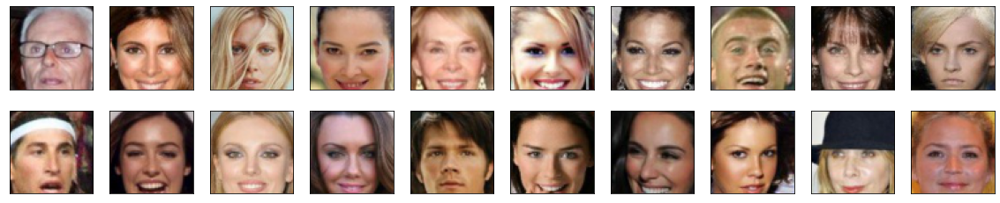

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [12]:
from torch.nn import Module

In [14]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        
        # the (first) conv. without batch normalization
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4,
                                     stride=2, padding=1, bias=False) # img_size = 64*64 => 3*64*64
        
        self.conv2 = torch.nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 128*16*16
        self.batchNorm2 = torch.nn.BatchNorm2d(128)
        
        self.conv3 = torch.nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 256*8*8
        self.batchNorm3 = torch.nn.BatchNorm2d(256)

        self.conv4 = torch.nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 512*4*4
        
        self.batchNorm4 = torch.nn.BatchNorm2d(512)
        
        self.flatten = torch.nn.Flatten()
        
        self.fc = torch.nn.Linear(512*4*4, 1)
        
        self.LeakyReLU = torch.nn.LeakyReLU(0.3)

        self.dropout = torch.nn.Dropout(0.3)
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method

        x = self.LeakyReLU(self.conv1(x))
        x = self.LeakyReLU(self.batchNorm2(self.conv2(x)))
        x = self.LeakyReLU(self.batchNorm3(self.conv3(x)))
        x = self.LeakyReLU(self.batchNorm4(self.conv4(x)))
        x = self.flatten(x)
        x = self.dropout(self.fc(x))

        return x.view(1, 1, 1, -1)

In [15]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [18]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        
        self.deconv1 = torch.nn.ConvTranspose2d(in_channels=latent_dim, out_channels=512,
                                                kernel_size=4, stride=1, padding=0, bias=False)
        self.batchNorm1 = torch.nn.BatchNorm2d(512)
        
        self.deconv2 = torch.nn.ConvTranspose2d(in_channels=512, out_channels=256,
                                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm2 = torch.nn.BatchNorm2d(256)
        
        
        self.deconv3 = torch.nn.ConvTranspose2d(in_channels=256, out_channels=128,
                                        kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm3 = torch.nn.BatchNorm2d(128)
        
        
        self.deconv4 = torch.nn.ConvTranspose2d(in_channels=128, out_channels=64,
                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm4 = torch.nn.BatchNorm2d(64)

        # the (last) conv. without batch normalization
        self.deconv5 = torch.nn.ConvTranspose2d(in_channels=64, out_channels=3,
                                        kernel_size=4, stride=2, padding=1, bias=True)

        self.relu = torch.nn.ReLU() # for conv. layers (except the last)
        self.tanh = torch.nn.Tanh() # for the last conv. layer

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        
        x = self.relu(self.batchNorm1(self.deconv1(x)))
        x = self.relu(self.batchNorm2(self.deconv2(x)))
        x = self.relu(self.batchNorm3(self.deconv3(x)))
        x = self.relu(self.batchNorm4(self.deconv4(x)))
        x = self.tanh(self.deconv5(x))

        return x

In [20]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation

latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [23]:
import torch.optim as optim

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    # param based on experiments 
    
    lr = 0.0002
    beta1=0.5
    beta2=0.999 # default.
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])

    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [25]:
def real_loss(D_out, smooth):

    labels = torch.ones_like(D_out)*0.9 if smooth else torch.ones_like(D_out) 
    labels = labels.cuda()
    
    criterion = torch.nn.BCEWithLogitsLoss()
    return criterion(D_out, labels) # loss

In [26]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    
    # TODO: implement the generator loss 
    return real_loss(D_fake, smooth= True)

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [28]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    
    # real loss
    r_loss = real_loss(real_logits, smooth= True)
    
    # fake loss
    labels = torch.zeros_like(fake_logits).cuda() # all fake labels zeros
    criterion = torch.nn.BCEWithLogitsLoss()
    f_loss = criterion(fake_logits, labels)
    
    loss = r_loss + f_loss
    
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [30]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    
    gp = 0
    # TODO (Optional): implement the gradient penalty    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [32]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    
    g_optimizer.zero_grad()
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z)
    
    # get discriminator losses on fake images using flipped labels
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, smooth= True)
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    
    gp=0 # I'm not using gradient penalty 
    
    d_optimizer.zero_grad()
    
    D_real = discriminator(real_images)
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z) 
    
    D_fake = discriminator(fake_images.detach())
    d_loss = discriminator_loss(D_real, D_fake)
    
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [33]:
from datetime import datetime

In [34]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [35]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [36]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-02-26 04:02:22 | Epoch [1/20] | Batch 0/509 | d_loss: 1.3542 | g_loss: 2.5422
2024-02-26 04:02:26 | Epoch [1/20] | Batch 50/509 | d_loss: 1.5067 | g_loss: 6.0209
2024-02-26 04:02:30 | Epoch [1/20] | Batch 100/509 | d_loss: 1.5738 | g_loss: 3.9205
2024-02-26 04:02:34 | Epoch [1/20] | Batch 150/509 | d_loss: 1.2967 | g_loss: 2.3625
2024-02-26 04:02:38 | Epoch [1/20] | Batch 200/509 | d_loss: 1.2877 | g_loss: 1.7730
2024-02-26 04:02:43 | Epoch [1/20] | Batch 250/509 | d_loss: 1.2380 | g_loss: 1.8444
2024-02-26 04:02:47 | Epoch [1/20] | Batch 300/509 | d_loss: 1.3756 | g_loss: 1.5123
2024-02-26 04:02:51 | Epoch [1/20] | Batch 350/509 | d_loss: 1.2663 | g_loss: 1.1376
2024-02-26 04:02:55 | Epoch [1/20] | Batch 400/509 | d_loss: 1.5661 | g_loss: 1.5633
2024-02-26 04:02:59 | Epoch [1/20] | Batch 450/509 | d_loss: 1.4916 | g_loss: 2.3291
2024-02-26 04:03:04 | Epoch [1/20] | Batch 500/509 | d_loss: 1.3292 | g_loss: 1.3204


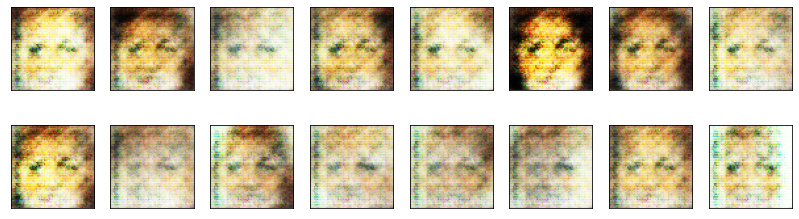

2024-02-26 04:03:08 | Epoch [2/20] | Batch 0/509 | d_loss: 1.1900 | g_loss: 1.2142
2024-02-26 04:03:13 | Epoch [2/20] | Batch 50/509 | d_loss: 1.3391 | g_loss: 1.5683
2024-02-26 04:03:17 | Epoch [2/20] | Batch 100/509 | d_loss: 1.3570 | g_loss: 0.9831
2024-02-26 04:03:22 | Epoch [2/20] | Batch 150/509 | d_loss: 1.5215 | g_loss: 1.9516
2024-02-26 04:03:26 | Epoch [2/20] | Batch 200/509 | d_loss: 1.3279 | g_loss: 1.2403
2024-02-26 04:03:30 | Epoch [2/20] | Batch 250/509 | d_loss: 1.3131 | g_loss: 1.2805
2024-02-26 04:03:34 | Epoch [2/20] | Batch 300/509 | d_loss: 1.3917 | g_loss: 1.1044
2024-02-26 04:03:39 | Epoch [2/20] | Batch 350/509 | d_loss: 1.3797 | g_loss: 0.9042
2024-02-26 04:03:43 | Epoch [2/20] | Batch 400/509 | d_loss: 1.3987 | g_loss: 1.3407
2024-02-26 04:03:47 | Epoch [2/20] | Batch 450/509 | d_loss: 1.2814 | g_loss: 1.5432
2024-02-26 04:03:51 | Epoch [2/20] | Batch 500/509 | d_loss: 1.2545 | g_loss: 1.6622


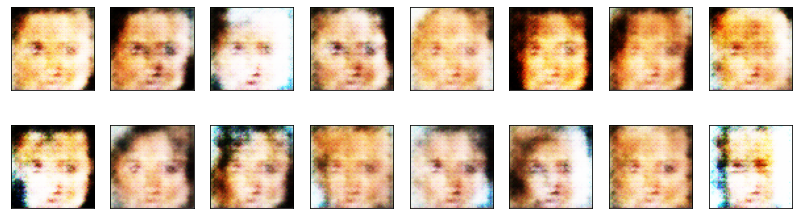

2024-02-26 04:03:56 | Epoch [3/20] | Batch 0/509 | d_loss: 1.4069 | g_loss: 0.8899
2024-02-26 04:04:01 | Epoch [3/20] | Batch 50/509 | d_loss: 1.3704 | g_loss: 1.0913
2024-02-26 04:04:05 | Epoch [3/20] | Batch 100/509 | d_loss: 1.2300 | g_loss: 1.4335
2024-02-26 04:04:10 | Epoch [3/20] | Batch 150/509 | d_loss: 1.3429 | g_loss: 1.4960
2024-02-26 04:04:14 | Epoch [3/20] | Batch 200/509 | d_loss: 1.2813 | g_loss: 2.3532
2024-02-26 04:04:18 | Epoch [3/20] | Batch 250/509 | d_loss: 1.2507 | g_loss: 1.2345
2024-02-26 04:04:23 | Epoch [3/20] | Batch 300/509 | d_loss: 1.3846 | g_loss: 1.7320
2024-02-26 04:04:27 | Epoch [3/20] | Batch 350/509 | d_loss: 1.2376 | g_loss: 1.4428
2024-02-26 04:04:31 | Epoch [3/20] | Batch 400/509 | d_loss: 1.6058 | g_loss: 0.9489
2024-02-26 04:04:35 | Epoch [3/20] | Batch 450/509 | d_loss: 1.2939 | g_loss: 1.1295
2024-02-26 04:04:40 | Epoch [3/20] | Batch 500/509 | d_loss: 1.4486 | g_loss: 2.1999


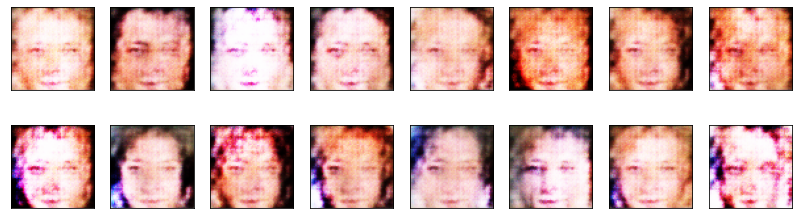

2024-02-26 04:04:45 | Epoch [4/20] | Batch 0/509 | d_loss: 1.2436 | g_loss: 1.2486
2024-02-26 04:04:50 | Epoch [4/20] | Batch 50/509 | d_loss: 1.4184 | g_loss: 1.0142
2024-02-26 04:04:55 | Epoch [4/20] | Batch 100/509 | d_loss: 1.4276 | g_loss: 1.4780
2024-02-26 04:04:59 | Epoch [4/20] | Batch 150/509 | d_loss: 1.3017 | g_loss: 1.3764
2024-02-26 04:05:03 | Epoch [4/20] | Batch 200/509 | d_loss: 1.4819 | g_loss: 1.3283
2024-02-26 04:05:08 | Epoch [4/20] | Batch 250/509 | d_loss: 1.3235 | g_loss: 1.5284
2024-02-26 04:05:12 | Epoch [4/20] | Batch 300/509 | d_loss: 1.3135 | g_loss: 1.7257
2024-02-26 04:05:17 | Epoch [4/20] | Batch 350/509 | d_loss: 1.5924 | g_loss: 1.1268
2024-02-26 04:05:21 | Epoch [4/20] | Batch 400/509 | d_loss: 1.3533 | g_loss: 1.0929
2024-02-26 04:05:25 | Epoch [4/20] | Batch 450/509 | d_loss: 1.4104 | g_loss: 1.4167
2024-02-26 04:05:30 | Epoch [4/20] | Batch 500/509 | d_loss: 1.4122 | g_loss: 2.2279


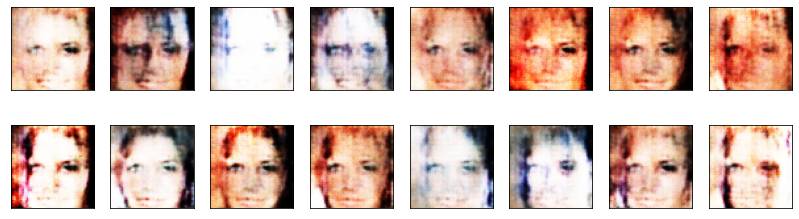

2024-02-26 04:05:34 | Epoch [5/20] | Batch 0/509 | d_loss: 1.2208 | g_loss: 1.2533
2024-02-26 04:05:39 | Epoch [5/20] | Batch 50/509 | d_loss: 1.2661 | g_loss: 1.1902
2024-02-26 04:05:43 | Epoch [5/20] | Batch 100/509 | d_loss: 1.4698 | g_loss: 1.0953
2024-02-26 04:05:48 | Epoch [5/20] | Batch 150/509 | d_loss: 1.3026 | g_loss: 1.5345
2024-02-26 04:05:52 | Epoch [5/20] | Batch 200/509 | d_loss: 1.3436 | g_loss: 1.3153
2024-02-26 04:05:57 | Epoch [5/20] | Batch 250/509 | d_loss: 1.4273 | g_loss: 1.1859
2024-02-26 04:06:01 | Epoch [5/20] | Batch 300/509 | d_loss: 1.2101 | g_loss: 1.3013
2024-02-26 04:06:05 | Epoch [5/20] | Batch 350/509 | d_loss: 1.3513 | g_loss: 1.6113
2024-02-26 04:06:10 | Epoch [5/20] | Batch 400/509 | d_loss: 1.3464 | g_loss: 1.5083
2024-02-26 04:06:14 | Epoch [5/20] | Batch 450/509 | d_loss: 1.3032 | g_loss: 1.3284
2024-02-26 04:06:18 | Epoch [5/20] | Batch 500/509 | d_loss: 1.2681 | g_loss: 1.4614


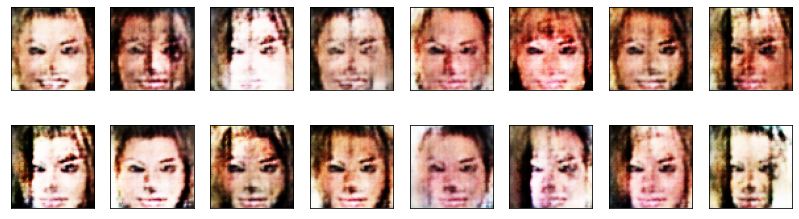

2024-02-26 04:06:23 | Epoch [6/20] | Batch 0/509 | d_loss: 1.3523 | g_loss: 0.9764
2024-02-26 04:06:28 | Epoch [6/20] | Batch 50/509 | d_loss: 1.2892 | g_loss: 1.4907
2024-02-26 04:06:33 | Epoch [6/20] | Batch 100/509 | d_loss: 1.4354 | g_loss: 1.5786
2024-02-26 04:06:37 | Epoch [6/20] | Batch 150/509 | d_loss: 1.2169 | g_loss: 1.4819
2024-02-26 04:06:41 | Epoch [6/20] | Batch 200/509 | d_loss: 1.2359 | g_loss: 1.4195
2024-02-26 04:06:46 | Epoch [6/20] | Batch 250/509 | d_loss: 1.2599 | g_loss: 1.3649
2024-02-26 04:06:50 | Epoch [6/20] | Batch 300/509 | d_loss: 1.3137 | g_loss: 1.6235
2024-02-26 04:06:55 | Epoch [6/20] | Batch 350/509 | d_loss: 1.1691 | g_loss: 1.1966
2024-02-26 04:06:59 | Epoch [6/20] | Batch 400/509 | d_loss: 1.2791 | g_loss: 1.8157
2024-02-26 04:07:04 | Epoch [6/20] | Batch 450/509 | d_loss: 1.4404 | g_loss: 1.1193
2024-02-26 04:07:08 | Epoch [6/20] | Batch 500/509 | d_loss: 1.6106 | g_loss: 1.1966


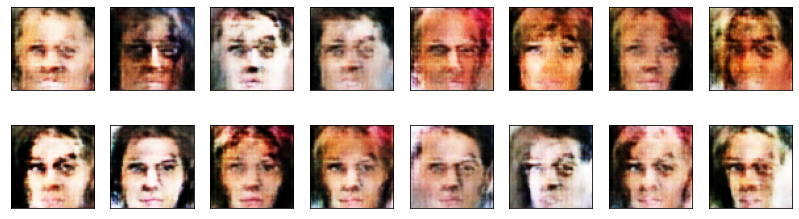

2024-02-26 04:07:13 | Epoch [7/20] | Batch 0/509 | d_loss: 1.1419 | g_loss: 1.4189
2024-02-26 04:07:18 | Epoch [7/20] | Batch 50/509 | d_loss: 1.2287 | g_loss: 1.7372
2024-02-26 04:07:23 | Epoch [7/20] | Batch 100/509 | d_loss: 1.2479 | g_loss: 1.4075
2024-02-26 04:07:27 | Epoch [7/20] | Batch 150/509 | d_loss: 1.2156 | g_loss: 1.2617
2024-02-26 04:07:32 | Epoch [7/20] | Batch 200/509 | d_loss: 1.1753 | g_loss: 1.2297
2024-02-26 04:07:36 | Epoch [7/20] | Batch 250/509 | d_loss: 1.2919 | g_loss: 1.4189
2024-02-26 04:07:41 | Epoch [7/20] | Batch 300/509 | d_loss: 1.3342 | g_loss: 1.1938
2024-02-26 04:07:45 | Epoch [7/20] | Batch 350/509 | d_loss: 1.7117 | g_loss: 1.4164
2024-02-26 04:07:49 | Epoch [7/20] | Batch 400/509 | d_loss: 1.4730 | g_loss: 1.0819
2024-02-26 04:07:54 | Epoch [7/20] | Batch 450/509 | d_loss: 1.3101 | g_loss: 1.2096
2024-02-26 04:07:58 | Epoch [7/20] | Batch 500/509 | d_loss: 1.3116 | g_loss: 1.0144


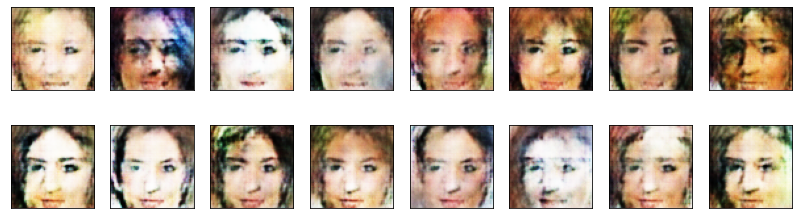

2024-02-26 04:08:03 | Epoch [8/20] | Batch 0/509 | d_loss: 1.1044 | g_loss: 1.7140
2024-02-26 04:08:07 | Epoch [8/20] | Batch 50/509 | d_loss: 1.1735 | g_loss: 1.2756
2024-02-26 04:08:12 | Epoch [8/20] | Batch 100/509 | d_loss: 1.3124 | g_loss: 1.9356
2024-02-26 04:08:16 | Epoch [8/20] | Batch 150/509 | d_loss: 1.2680 | g_loss: 1.7679
2024-02-26 04:08:21 | Epoch [8/20] | Batch 200/509 | d_loss: 1.3684 | g_loss: 1.6989
2024-02-26 04:08:25 | Epoch [8/20] | Batch 250/509 | d_loss: 1.4863 | g_loss: 1.0157
2024-02-26 04:08:30 | Epoch [8/20] | Batch 300/509 | d_loss: 1.2365 | g_loss: 1.4283
2024-02-26 04:08:34 | Epoch [8/20] | Batch 350/509 | d_loss: 1.1755 | g_loss: 1.5064
2024-02-26 04:08:39 | Epoch [8/20] | Batch 400/509 | d_loss: 1.2822 | g_loss: 1.4734
2024-02-26 04:08:43 | Epoch [8/20] | Batch 450/509 | d_loss: 1.2245 | g_loss: 1.3942
2024-02-26 04:08:47 | Epoch [8/20] | Batch 500/509 | d_loss: 1.3875 | g_loss: 1.1457


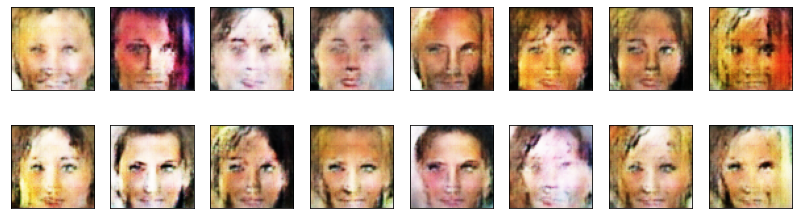

2024-02-26 04:08:52 | Epoch [9/20] | Batch 0/509 | d_loss: 1.0733 | g_loss: 1.3414
2024-02-26 04:08:56 | Epoch [9/20] | Batch 50/509 | d_loss: 1.2133 | g_loss: 1.0655
2024-02-26 04:09:01 | Epoch [9/20] | Batch 100/509 | d_loss: 1.1612 | g_loss: 1.1043
2024-02-26 04:09:05 | Epoch [9/20] | Batch 150/509 | d_loss: 1.2047 | g_loss: 1.3237
2024-02-26 04:09:09 | Epoch [9/20] | Batch 200/509 | d_loss: 1.3466 | g_loss: 0.8657
2024-02-26 04:09:14 | Epoch [9/20] | Batch 250/509 | d_loss: 1.4251 | g_loss: 1.1049
2024-02-26 04:09:19 | Epoch [9/20] | Batch 300/509 | d_loss: 1.1876 | g_loss: 1.3028
2024-02-26 04:09:23 | Epoch [9/20] | Batch 350/509 | d_loss: 1.3082 | g_loss: 1.7193
2024-02-26 04:09:28 | Epoch [9/20] | Batch 400/509 | d_loss: 1.3974 | g_loss: 2.6155
2024-02-26 04:09:32 | Epoch [9/20] | Batch 450/509 | d_loss: 1.1727 | g_loss: 1.1372
2024-02-26 04:09:37 | Epoch [9/20] | Batch 500/509 | d_loss: 1.2096 | g_loss: 1.4747


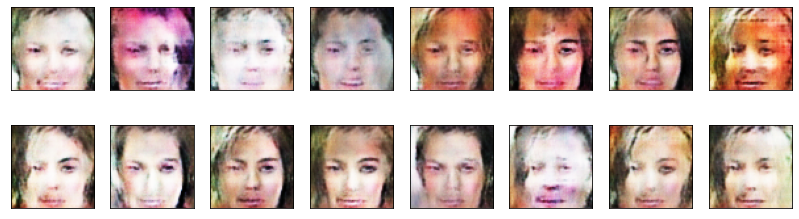

2024-02-26 04:09:42 | Epoch [10/20] | Batch 0/509 | d_loss: 1.1857 | g_loss: 1.9776
2024-02-26 04:09:47 | Epoch [10/20] | Batch 50/509 | d_loss: 1.1800 | g_loss: 2.1908
2024-02-26 04:09:52 | Epoch [10/20] | Batch 100/509 | d_loss: 1.3953 | g_loss: 1.1312
2024-02-26 04:09:56 | Epoch [10/20] | Batch 150/509 | d_loss: 1.1795 | g_loss: 1.3017
2024-02-26 04:10:01 | Epoch [10/20] | Batch 200/509 | d_loss: 1.2065 | g_loss: 1.2725
2024-02-26 04:10:05 | Epoch [10/20] | Batch 250/509 | d_loss: 1.4011 | g_loss: 1.8993
2024-02-26 04:10:10 | Epoch [10/20] | Batch 300/509 | d_loss: 1.2121 | g_loss: 1.3221
2024-02-26 04:10:14 | Epoch [10/20] | Batch 350/509 | d_loss: 1.3048 | g_loss: 1.0350
2024-02-26 04:10:19 | Epoch [10/20] | Batch 400/509 | d_loss: 1.4423 | g_loss: 1.4820
2024-02-26 04:10:23 | Epoch [10/20] | Batch 450/509 | d_loss: 1.2262 | g_loss: 1.3118
2024-02-26 04:10:28 | Epoch [10/20] | Batch 500/509 | d_loss: 1.1948 | g_loss: 1.9968


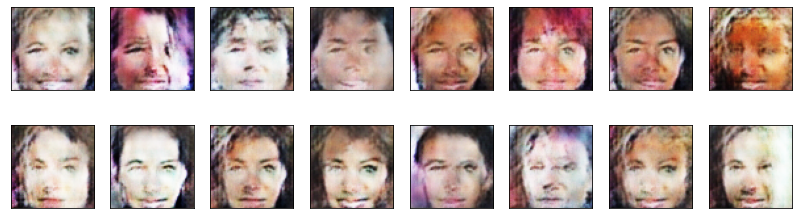

2024-02-26 04:10:32 | Epoch [11/20] | Batch 0/509 | d_loss: 1.1737 | g_loss: 1.6406
2024-02-26 04:10:37 | Epoch [11/20] | Batch 50/509 | d_loss: 1.1519 | g_loss: 1.5425
2024-02-26 04:10:41 | Epoch [11/20] | Batch 100/509 | d_loss: 1.0052 | g_loss: 1.9448
2024-02-26 04:10:46 | Epoch [11/20] | Batch 150/509 | d_loss: 1.2137 | g_loss: 1.4552
2024-02-26 04:10:50 | Epoch [11/20] | Batch 200/509 | d_loss: 1.0144 | g_loss: 1.6555
2024-02-26 04:10:55 | Epoch [11/20] | Batch 250/509 | d_loss: 0.9838 | g_loss: 1.7007
2024-02-26 04:11:00 | Epoch [11/20] | Batch 300/509 | d_loss: 1.2405 | g_loss: 1.1351
2024-02-26 04:11:05 | Epoch [11/20] | Batch 350/509 | d_loss: 1.1243 | g_loss: 1.8008
2024-02-26 04:11:09 | Epoch [11/20] | Batch 400/509 | d_loss: 1.2489 | g_loss: 1.8608
2024-02-26 04:11:14 | Epoch [11/20] | Batch 450/509 | d_loss: 1.2114 | g_loss: 1.5108
2024-02-26 04:11:18 | Epoch [11/20] | Batch 500/509 | d_loss: 1.3672 | g_loss: 1.2663


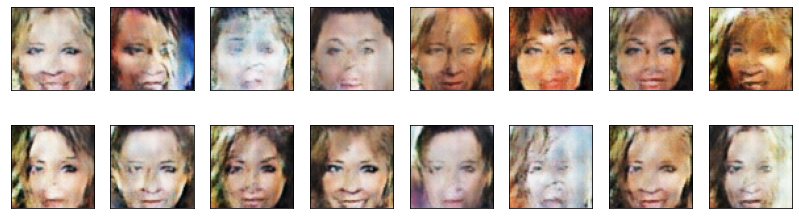

2024-02-26 04:11:25 | Epoch [12/20] | Batch 0/509 | d_loss: 1.1044 | g_loss: 1.5564
2024-02-26 04:11:30 | Epoch [12/20] | Batch 50/509 | d_loss: 1.2234 | g_loss: 1.9120
2024-02-26 04:11:34 | Epoch [12/20] | Batch 100/509 | d_loss: 1.1845 | g_loss: 1.4523
2024-02-26 04:11:39 | Epoch [12/20] | Batch 150/509 | d_loss: 1.5696 | g_loss: 1.0163
2024-02-26 04:11:43 | Epoch [12/20] | Batch 200/509 | d_loss: 1.2928 | g_loss: 1.3288
2024-02-26 04:11:48 | Epoch [12/20] | Batch 250/509 | d_loss: 1.2219 | g_loss: 1.3624
2024-02-26 04:11:52 | Epoch [12/20] | Batch 300/509 | d_loss: 1.2720 | g_loss: 2.0960
2024-02-26 04:11:57 | Epoch [12/20] | Batch 350/509 | d_loss: 1.4322 | g_loss: 0.8847
2024-02-26 04:12:02 | Epoch [12/20] | Batch 400/509 | d_loss: 1.3551 | g_loss: 2.0544
2024-02-26 04:12:06 | Epoch [12/20] | Batch 450/509 | d_loss: 1.1105 | g_loss: 1.6257
2024-02-26 04:12:11 | Epoch [12/20] | Batch 500/509 | d_loss: 1.4714 | g_loss: 0.8405


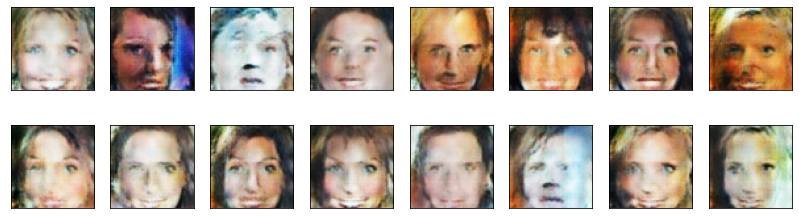

2024-02-26 04:12:15 | Epoch [13/20] | Batch 0/509 | d_loss: 1.1110 | g_loss: 1.0619
2024-02-26 04:12:20 | Epoch [13/20] | Batch 50/509 | d_loss: 1.3903 | g_loss: 1.5974
2024-02-26 04:12:25 | Epoch [13/20] | Batch 100/509 | d_loss: 1.2195 | g_loss: 1.9445
2024-02-26 04:12:29 | Epoch [13/20] | Batch 150/509 | d_loss: 1.3514 | g_loss: 1.3382
2024-02-26 04:12:34 | Epoch [13/20] | Batch 200/509 | d_loss: 1.1839 | g_loss: 1.4050
2024-02-26 04:12:39 | Epoch [13/20] | Batch 250/509 | d_loss: 1.1451 | g_loss: 1.5351
2024-02-26 04:12:43 | Epoch [13/20] | Batch 300/509 | d_loss: 1.2744 | g_loss: 1.0483
2024-02-26 04:12:48 | Epoch [13/20] | Batch 350/509 | d_loss: 1.3564 | g_loss: 1.1885
2024-02-26 04:12:52 | Epoch [13/20] | Batch 400/509 | d_loss: 1.1637 | g_loss: 1.1474
2024-02-26 04:12:57 | Epoch [13/20] | Batch 450/509 | d_loss: 1.3086 | g_loss: 1.9544
2024-02-26 04:13:02 | Epoch [13/20] | Batch 500/509 | d_loss: 1.1435 | g_loss: 1.1654


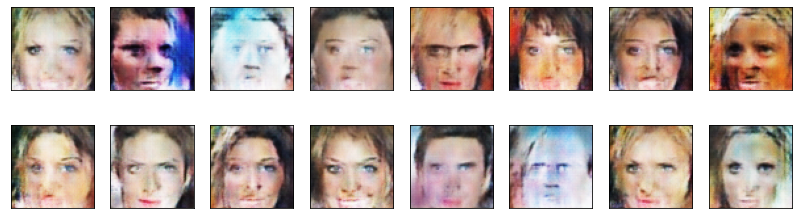

2024-02-26 04:13:08 | Epoch [14/20] | Batch 0/509 | d_loss: 1.2404 | g_loss: 1.9047
2024-02-26 04:13:12 | Epoch [14/20] | Batch 50/509 | d_loss: 1.2261 | g_loss: 1.4782
2024-02-26 04:13:17 | Epoch [14/20] | Batch 100/509 | d_loss: 1.1667 | g_loss: 1.1386
2024-02-26 04:13:22 | Epoch [14/20] | Batch 150/509 | d_loss: 1.3215 | g_loss: 1.3805
2024-02-26 04:13:27 | Epoch [14/20] | Batch 200/509 | d_loss: 1.2655 | g_loss: 1.5053
2024-02-26 04:13:32 | Epoch [14/20] | Batch 250/509 | d_loss: 1.5870 | g_loss: 1.2321
2024-02-26 04:13:36 | Epoch [14/20] | Batch 300/509 | d_loss: 1.3470 | g_loss: 0.9962
2024-02-26 04:13:41 | Epoch [14/20] | Batch 350/509 | d_loss: 1.3260 | g_loss: 1.0461
2024-02-26 04:13:45 | Epoch [14/20] | Batch 400/509 | d_loss: 1.1407 | g_loss: 1.3268
2024-02-26 04:13:50 | Epoch [14/20] | Batch 450/509 | d_loss: 1.2342 | g_loss: 1.2575
2024-02-26 04:13:54 | Epoch [14/20] | Batch 500/509 | d_loss: 1.3578 | g_loss: 1.0028


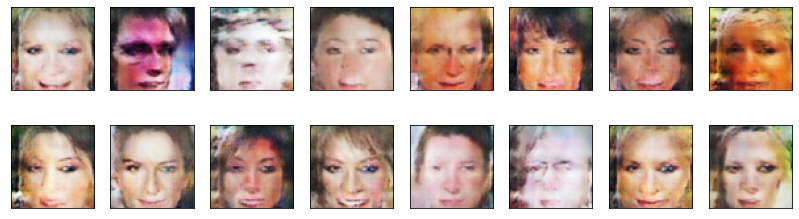

2024-02-26 04:13:58 | Epoch [15/20] | Batch 0/509 | d_loss: 1.1765 | g_loss: 1.3140
2024-02-26 04:14:03 | Epoch [15/20] | Batch 50/509 | d_loss: 1.5289 | g_loss: 2.4381
2024-02-26 04:14:08 | Epoch [15/20] | Batch 100/509 | d_loss: 1.3561 | g_loss: 2.3646
2024-02-26 04:14:13 | Epoch [15/20] | Batch 150/509 | d_loss: 1.3733 | g_loss: 0.7336
2024-02-26 04:14:18 | Epoch [15/20] | Batch 200/509 | d_loss: 1.2670 | g_loss: 1.2904
2024-02-26 04:14:22 | Epoch [15/20] | Batch 250/509 | d_loss: 1.3685 | g_loss: 1.4993
2024-02-26 04:14:28 | Epoch [15/20] | Batch 300/509 | d_loss: 1.2593 | g_loss: 0.9002
2024-02-26 04:14:32 | Epoch [15/20] | Batch 350/509 | d_loss: 1.4306 | g_loss: 1.0410
2024-02-26 04:14:37 | Epoch [15/20] | Batch 400/509 | d_loss: 1.3325 | g_loss: 1.1650
2024-02-26 04:14:42 | Epoch [15/20] | Batch 450/509 | d_loss: 1.2010 | g_loss: 1.1605
2024-02-26 04:14:46 | Epoch [15/20] | Batch 500/509 | d_loss: 1.3783 | g_loss: 1.5860


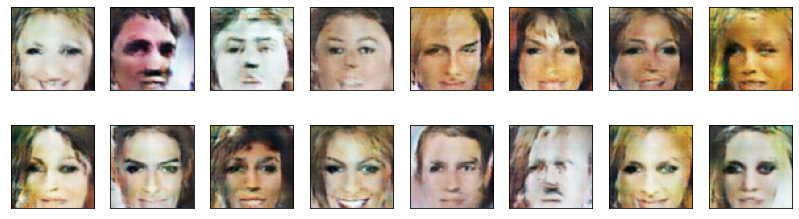

2024-02-26 04:14:51 | Epoch [16/20] | Batch 0/509 | d_loss: 1.3846 | g_loss: 2.0478
2024-02-26 04:14:56 | Epoch [16/20] | Batch 50/509 | d_loss: 1.2774 | g_loss: 1.0272
2024-02-26 04:15:00 | Epoch [16/20] | Batch 100/509 | d_loss: 1.2567 | g_loss: 1.3420
2024-02-26 04:15:05 | Epoch [16/20] | Batch 150/509 | d_loss: 1.0970 | g_loss: 1.3000
2024-02-26 04:15:10 | Epoch [16/20] | Batch 200/509 | d_loss: 1.3011 | g_loss: 1.7785
2024-02-26 04:15:14 | Epoch [16/20] | Batch 250/509 | d_loss: 1.2807 | g_loss: 1.1889
2024-02-26 04:15:19 | Epoch [16/20] | Batch 300/509 | d_loss: 1.3481 | g_loss: 2.3120
2024-02-26 04:15:23 | Epoch [16/20] | Batch 350/509 | d_loss: 1.3518 | g_loss: 1.6547
2024-02-26 04:15:28 | Epoch [16/20] | Batch 400/509 | d_loss: 1.5719 | g_loss: 0.9023
2024-02-26 04:15:33 | Epoch [16/20] | Batch 450/509 | d_loss: 1.3768 | g_loss: 1.0168
2024-02-26 04:15:37 | Epoch [16/20] | Batch 500/509 | d_loss: 1.3012 | g_loss: 0.8742


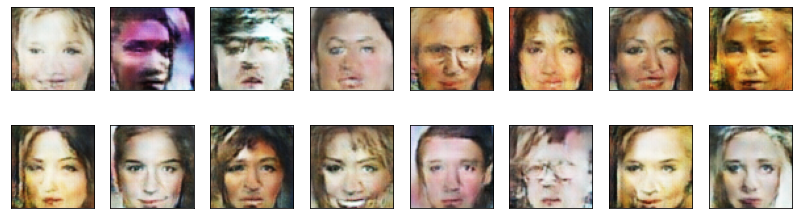

2024-02-26 04:15:43 | Epoch [17/20] | Batch 0/509 | d_loss: 1.1765 | g_loss: 1.0127
2024-02-26 04:15:47 | Epoch [17/20] | Batch 50/509 | d_loss: 1.0600 | g_loss: 1.3362
2024-02-26 04:15:52 | Epoch [17/20] | Batch 100/509 | d_loss: 1.2379 | g_loss: 1.0039
2024-02-26 04:15:57 | Epoch [17/20] | Batch 150/509 | d_loss: 1.3475 | g_loss: 2.3111
2024-02-26 04:16:01 | Epoch [17/20] | Batch 200/509 | d_loss: 1.2400 | g_loss: 1.6262
2024-02-26 04:16:06 | Epoch [17/20] | Batch 250/509 | d_loss: 1.0912 | g_loss: 1.2171
2024-02-26 04:16:11 | Epoch [17/20] | Batch 300/509 | d_loss: 1.3794 | g_loss: 1.2377
2024-02-26 04:16:15 | Epoch [17/20] | Batch 350/509 | d_loss: 1.1278 | g_loss: 1.8388
2024-02-26 04:16:20 | Epoch [17/20] | Batch 400/509 | d_loss: 1.1240 | g_loss: 1.1673
2024-02-26 04:16:25 | Epoch [17/20] | Batch 450/509 | d_loss: 1.0893 | g_loss: 1.0081
2024-02-26 04:16:29 | Epoch [17/20] | Batch 500/509 | d_loss: 1.2307 | g_loss: 1.2415


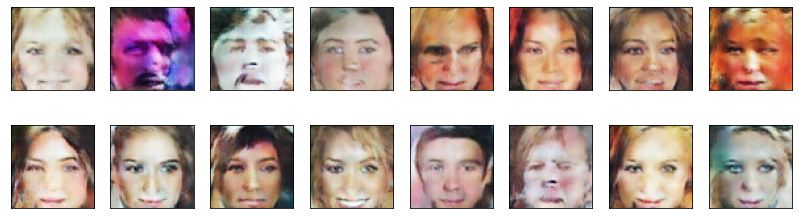

2024-02-26 04:16:35 | Epoch [18/20] | Batch 0/509 | d_loss: 1.4304 | g_loss: 0.9771
2024-02-26 04:16:39 | Epoch [18/20] | Batch 50/509 | d_loss: 1.1144 | g_loss: 1.4666
2024-02-26 04:16:44 | Epoch [18/20] | Batch 100/509 | d_loss: 1.1787 | g_loss: 1.5672
2024-02-26 04:16:49 | Epoch [18/20] | Batch 150/509 | d_loss: 1.2474 | g_loss: 1.1237
2024-02-26 04:16:53 | Epoch [18/20] | Batch 200/509 | d_loss: 1.2356 | g_loss: 1.2411
2024-02-26 04:16:58 | Epoch [18/20] | Batch 250/509 | d_loss: 1.4349 | g_loss: 2.2271
2024-02-26 04:17:03 | Epoch [18/20] | Batch 300/509 | d_loss: 1.0980 | g_loss: 1.3593
2024-02-26 04:17:07 | Epoch [18/20] | Batch 350/509 | d_loss: 1.1743 | g_loss: 1.0824
2024-02-26 04:17:12 | Epoch [18/20] | Batch 400/509 | d_loss: 1.2511 | g_loss: 1.4398
2024-02-26 04:17:17 | Epoch [18/20] | Batch 450/509 | d_loss: 1.1935 | g_loss: 1.2976
2024-02-26 04:17:21 | Epoch [18/20] | Batch 500/509 | d_loss: 1.1519 | g_loss: 1.1691


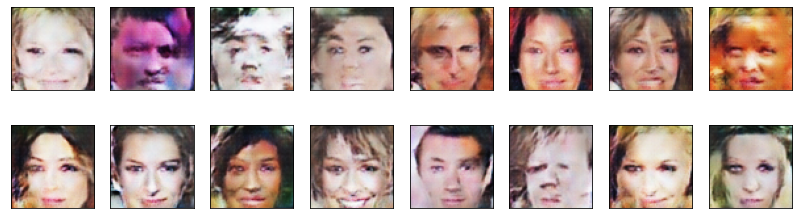

2024-02-26 04:17:27 | Epoch [19/20] | Batch 0/509 | d_loss: 1.0669 | g_loss: 0.8612
2024-02-26 04:17:32 | Epoch [19/20] | Batch 50/509 | d_loss: 1.4713 | g_loss: 2.2912
2024-02-26 04:17:37 | Epoch [19/20] | Batch 100/509 | d_loss: 1.2668 | g_loss: 1.6126
2024-02-26 04:17:42 | Epoch [19/20] | Batch 150/509 | d_loss: 1.3168 | g_loss: 1.0737
2024-02-26 04:17:47 | Epoch [19/20] | Batch 200/509 | d_loss: 1.1665 | g_loss: 1.6456
2024-02-26 04:17:51 | Epoch [19/20] | Batch 250/509 | d_loss: 1.2285 | g_loss: 1.2222
2024-02-26 04:17:56 | Epoch [19/20] | Batch 300/509 | d_loss: 1.4289 | g_loss: 2.0114
2024-02-26 04:18:01 | Epoch [19/20] | Batch 350/509 | d_loss: 1.1521 | g_loss: 1.5294
2024-02-26 04:18:06 | Epoch [19/20] | Batch 400/509 | d_loss: 1.5721 | g_loss: 1.8154
2024-02-26 04:18:10 | Epoch [19/20] | Batch 450/509 | d_loss: 1.3657 | g_loss: 2.3298
2024-02-26 04:18:15 | Epoch [19/20] | Batch 500/509 | d_loss: 1.0865 | g_loss: 1.6286


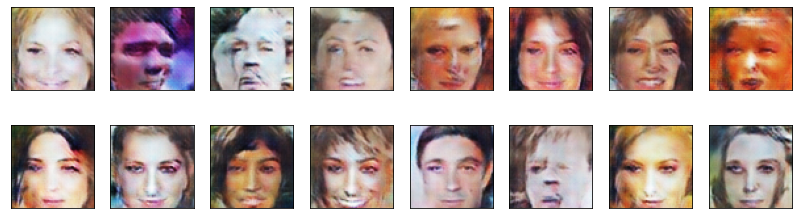

2024-02-26 04:18:20 | Epoch [20/20] | Batch 0/509 | d_loss: 1.0453 | g_loss: 0.7698
2024-02-26 04:18:25 | Epoch [20/20] | Batch 50/509 | d_loss: 1.3700 | g_loss: 0.6748
2024-02-26 04:18:30 | Epoch [20/20] | Batch 100/509 | d_loss: 1.0281 | g_loss: 0.9848
2024-02-26 04:18:35 | Epoch [20/20] | Batch 150/509 | d_loss: 1.2252 | g_loss: 1.8091
2024-02-26 04:18:39 | Epoch [20/20] | Batch 200/509 | d_loss: 1.1379 | g_loss: 1.2899
2024-02-26 04:18:44 | Epoch [20/20] | Batch 250/509 | d_loss: 1.2110 | g_loss: 0.7210
2024-02-26 04:18:48 | Epoch [20/20] | Batch 300/509 | d_loss: 1.1157 | g_loss: 1.5501
2024-02-26 04:18:53 | Epoch [20/20] | Batch 350/509 | d_loss: 1.2315 | g_loss: 1.0536
2024-02-26 04:18:58 | Epoch [20/20] | Batch 400/509 | d_loss: 1.1326 | g_loss: 1.4855
2024-02-26 04:19:02 | Epoch [20/20] | Batch 450/509 | d_loss: 1.2093 | g_loss: 1.8434
2024-02-26 04:19:07 | Epoch [20/20] | Batch 500/509 | d_loss: 1.0153 | g_loss: 2.0147


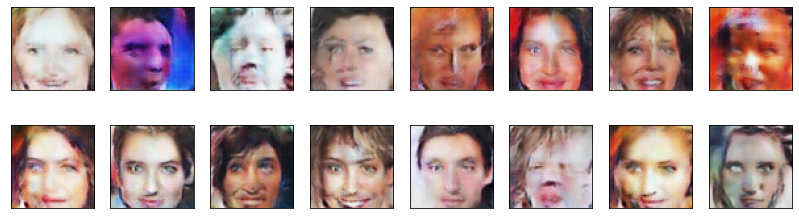

In [38]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # 1. train discriminator
        if batch_i % 2 == 0: # to train the generator more then the discriminator
            d_loss = discriminator_step(batch_size, latent_dim, real_images)
            
        # 2. train generator
        g_loss = generator_step(batch_size, latent_dim)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()


### Training losses

Plot the training losses for the generator and discriminator.

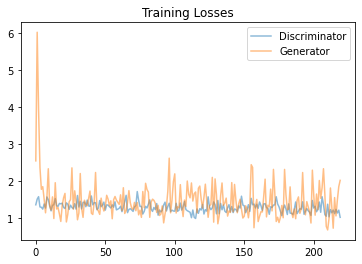

In [39]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
 The generated images have recognizble features of a human face like eyes, lips etc but it is hazy.

Increasing size of z vector and training epochs can give better outputs as that will decrease the generator loss.

The training data does not have the complete face. Features like chins are not visible. As a results, the generated images miss chins. Data should preferably have the complete face.

Obtaining higher resolution images. I would like to study NVIDIA's face generation paper where they trained HD faces and can even merge two faces to crate a new one.

A larger model size with more hidden dimensions would work better but take more training time

Training for longer will be ueful as the discriminator loss is steadily decreasing anf the generator loss curve is jagged indicating, it is imagining new features well, many of which are incorrect, but that's a step in the right direction.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.